In [1]:
suppressPackageStartupMessages(library(EBSeq))
suppressPackageStartupMessages(library(EBSeqHMM))
library(Trendy)
suppressPackageStartupMessages(library(SummarizedExperiment))
suppressPackageStartupMessages(library(tidyverse))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(DESeq2))
library(RColorBrewer)
require(plyr)
source('../prj_helpers.R')
temp<-read.csv(file = "../05-sample_overview/full_tissue_color.csv",header = F)
color_ft<-temp$V2
names(color_ft)<-temp$V1
color_ft
library(Seurat)

Warning message:
“package ‘S4Vectors’ was built under R version 4.1.3”
Loading required package: plyr

------------------------------------------------------------------------------

You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)

------------------------------------------------------------------------------


Attaching package: ‘plyr’


The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following object is masked from ‘package:purrr’:

    compact


The following object is masked from ‘package:IRanges’:

    desc


The following object is masked from ‘package:S4Vectors’:

    rename


The following object is masked from ‘package:matrixStats’:

    count




ERROR: Error in read.table(file = file, header = header, sep = sep, quote = quote, : no lines available in input


In [4]:
dds.qc.experimental.alltp<-readRDS(file="dds.qc.experimental.alltp")


In [5]:
dds.qc.experimental.alltp

class: DESeqDataSet 
dim: 35405 284 
metadata(1): version
assays(6): counts mu ... replaceCounts replaceCooks
rownames(35405): ENSMMUG00000023296.4 ENSMMUG00000036181.3 ... EBOV-L
  EBOV-3pTrailer
rowData names(39): Geneid Chr ... deviance.1 maxCooks.1
colnames(284): A0001_S121_L002 A0002_S124_L002 ... RA1779.Liver_S7
  RA1803_PBMC_D006_S13
colData names(70): file_identifiers A.identifier ... sizeFactor
  replaceable

In [6]:
table(dds.qc.experimental.alltp$full.tissue,dds.qc.experimental.alltp$dpi_time_factor)

                     
                      <0  0  3  4  5  6  7  8
  Adrenal Gland        0  3  1  2  0  1  2  1
  Brain:Brain-Gr       0  3  3  3  3  5  2  2
  Brain:Brain-Wh       0  1  1  1  3  1  1  1
  Kidney               0  3  3  2  3  5  2  2
  Liver                0  0  1  3  3  5  0  2
  Lung                 0  0  1  2  3  1  0  0
  Lymph node:LN-AX-R   0  3  3  3  3  5  2  2
  Lymph node:LN-ING-L  0  3  3  3  3  5  2  2
  Lymph node:LN-MES    0  3  2  2  3  5  2  2
  Lymph node:NA        0  0  0  0  0  0  0  0
  PBMC                 0  0  1  1  1  3  0  0
  Sex Organ:Ovary      0  1  2  0  2  3  2  0
  Sex Organ:Sex-Organ  0  2  1  3  0  3  0  0
  Sex Organ:Testis     0  0  1  2  0  1  0  1
  Skin:Non-Rash        0  3  3  0  3  3  2  1
  Skin:Rash            0  2  3  0  2  1  2  1
  SpinalCord           0  0  0  0  0  0  0  0
  Spleen               0  3  3  3  3  4  2  2
  Whole blood         34  9  6  6  2  5  2  2

In [7]:
dd<-dds.qc.experimental.alltp[,dds.qc.experimental.alltp$dpi_time_factor != '<0' & dds.qc.experimental.alltp$tissue %in% c('Adrenal Gland')]
dd$tissue
Data<- log10(counts(dd, normalized=TRUE)+1)
rownames(Data) <- rowData(dd)[rownames(Data),]$external_gene_name
Sizes <- sizeFactors(dd)
#Sizes <- MedianNorm(Data)
Conditions<-factor(x = dd$dpi_time_factor,levels=c(0,3,4,5,6,7,8))
names(Conditions)<-colnames(dd)
Conditions<-sort(Conditions)
Data<- Data[,names(sort(Conditions))]
Data<-Data[rownames(Data)[!is.na(rownames(Data)) & rownames(Data) != "" ],]
head(Data)



[1] Adrenal Gland Adrenal Gland Adrenal Gland Adrenal Gland Adrenal Gland
 [6] Adrenal Gland Adrenal Gland Adrenal Gland Adrenal Gland Adrenal Gland
14 Levels: Adrenal Gland Brain Kidney Liver Lung Lymph node Ovary ... Whole blood

,A0242,A0256,A0270,A0088,A0018,A0172,A0284,A0046,A0144,A0074_S61_L001
U6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000
ZNF692,2.004684,2.906482,2.152269,1.740982,1.249331,1.890943,1.885028,1.928257,0,2.352610
ZNF672,2.674702,0.000000,1.545138,1.491972,1.417191,1.387614,1.521806,1.179850,0,1.789288
SH3BP5L,0.000000,0.000000,2.268054,1.740982,1.928278,2.075546,2.045115,2.218845,0,2.585989
OR2T27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000
Y_RNA,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0.000000


In [8]:
library(ImpulseDE2)

[1] 0 0 0 3 3 3 4 4 4 5 5 5 6 6 6 6 7 7 8 8

In [24]:
dd<-dds.qc.experimental.alltp[,dds.qc.experimental.alltp$dpi_time_factor != '<0' & dds.qc.experimental.alltp$tissue %in% c('Adrenal Gland')]
Data<- counts(dd, normalized=FALSE)
rownames(Data) <- rowData(dd)[rownames(Data),]$external_gene_name
Conditions<-dd$dpi_time_factor
names(Conditions)<-colnames(dd)
Conditions<-sort(Conditions)
Data<- Data[,names(sort(Conditions))]
Data<-Data[rownames(Data)[!is.na(rownames(Data)) & rownames(Data) != "" ],]
rownames(Data) = make.names(rownames(Data), unique=TRUE)
head(Data)
Annotation=data.frame(Sample=names(Conditions),Time=(Conditions %>% factor %>% str_replace(',', '') %>% as.numeric),Condition="case")
Annotation

,A0242,A0256,A0270,A0088,A0018,A0172,A0284,A0046,A0144,A0074_S61_L001
U6,0,0,0,0,0,0,0,0,0,0
ZNF692,14,276,182,9,2,82,155,83,0,722
ZNF672,66,0,44,5,3,25,66,14,0,195
SH3BP5L,0,0,238,9,10,126,225,163,0,1238
OR2T27,0,0,0,0,0,0,0,0,0,0
Y_RNA,0,0,0,0,0,0,0,0,0,0


Sample,Time,Condition
<chr>,<dbl>,<chr>
A0242,0,case
A0256,0,case
A0270,0,case
A0088,3,case
A0018,4,case
A0172,4,case
A0284,6,case
A0046,7,case
A0144,7,case


In [10]:
objectImpulseDE2 <- runImpulseDE2(
  matCountData    = Data, 
  dfAnnotation    = Annotation,
  boolCaseCtrl    = FALSE,
  vecConfounders  = NULL,
  scaNProc        = 25,
    boolIdentifyTransients = TRUE )

ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,6,7,8
Case: Found the samples at time point 0: A0242,A0256,A0270
Case: Found the samples at time point 3: A0088
Case: Found the samples at time point 4: A0018,A0172
Case: Found the samples at time point 6: A0284
Case: Found the samples at time point 7: A0046,A0144
Case: Found the samples at time point 8: A0074_S61_L001
Input contained 23521 genes/regions.
Selected 15988 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.07 min.

# Compute size factors

# Fitting null and alternative model to the genes

Timing stopped at: 0.037 0.138 1.113

Timing stopped at: 5.716 0.216 6.93



In [149]:
objectImpulseDE2@dfImpulseDE2Results %>% filter(padj < 0.1)

Gene,p,padj,loglik_full,loglik_red,df_full,df_red,mean,converge_impulse,converge_const,converge_sigmoid,impulseTOsigmoid_p,impulseTOsigmoid_padj,sigmoidTOconst_p,sigmoidTOconst_padj,isTransient,isMonotonous,allZero
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<lgl>


In [7]:
library(ComplexHeatmap)
lsHeatmaps <- plotHeatmap(
  objectImpulseDE2       = objectImpulseDE2,
  strCondition           = "case",
  boolIdentifyTransients = FALSE,
  scaQThres              = 0.01)
draw(lsHeatmaps$complexHeatmapRaw)

Loading required package: grid

ComplexHeatmap version 2.10.0
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite:
Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
  genomic data. Bioinformatics 2016.

The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))




ERROR: Error in plotHeatmap(objectImpulseDE2 = objectImpulseDE2, strCondition = "case", : could not find function "plotHeatmap"


In [90]:
genes.ImpulseDE2.tissue <- lapply(unique(dds.qc.experimental.alltp$tissue), function(curr_tissue) {
    print(paste("This is the current tissue:",curr_tissue))
    dd<-dds.qc.experimental.alltp[,dds.qc.experimental.alltp$dpi_time_factor != '<0' &
                      dds.qc.experimental.alltp$tissue %in% c(curr_tissue)]

    Data<- counts(dd, normalized=FALSE)
    #rownames(Data) <- rowData(dd)[rownames(Data),]$external_gene_name
    Conditions<-dd$dpi_time_factor
    names(Conditions)<-colnames(dd)
    Conditions<-sort(Conditions)
    Data<- Data[,names(sort(Conditions))]
    Data<-Data[rownames(Data)[!is.na(rownames(Data)) & rownames(Data) != "" ],]
    rownames(Data) = make.names(rownames(Data), unique=TRUE)
    Annotation=data.frame(Sample=names(Conditions),
              Time=(Conditions %>% factor %>% str_replace(',', '') %>%
                    as.numeric),Condition="case")
    objectImpulseDE2 <- runImpulseDE2(
    matCountData    = Data, 
    dfAnnotation    = Annotation,
    boolCaseCtrl    = FALSE,
    vecConfounders  = NULL,
    scaNProc        = 30,
    boolIdentifyTransients = TRUE )
    objectImpulseDE2$dfImpulseDE2Results
})
saveRDS(genes.ImpulseDE2.tissue,file="genes.ImpulseDE2.tissue.rds")

[1] "This is the current tissue: Spleen"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0239_S23_L001,A0253_S22_L001,A0267_S11_L001
Case: Found the samples at time point 3: A0057_S117_L002,A0085_S115_L002,A0099_S114_L002
Case: Found the samples at time point 4: A0015_S120_L002,A0029_S119_L002,A0169_S109_L002
Case: Found the samples at time point 5: A0113_S113_L002,A0127_S112_L002,A0211_S106_L002
Case: Found the samples at time point 6: A0001_S121_L002,A0183_S108_L002,A0225_S24_L001,A0281_S10_L001
Case: Found the samples at time point 7: A0043_S118_L002,A0141_S111_L002
Case: Found the samples at time point 8: A0071_S116_L002,A0197_S107_L002
Input contained 35405 genes/regions.
Selected 29290 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 43 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.16 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 9.21 min.

# Fitting sigmoid model to case condition

Consumed time: 3.93 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 13.38 min.



[1] "This is the current tissue: Kidney"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0240_S95_L002,A0254_S93_L002,A0268_S92_L002
Case: Found the samples at time point 3: A0058_S120_L002,A0086_S60_L001,A0100_S114_L002
Case: Found the samples at time point 4: A0016_S123_L002,A0030_S122_L002
Case: Found the samples at time point 5: A0114_S112_L002,A0128_S55_L001,A0212_S97_L002
Case: Found the samples at time point 6: A0002_S124_L002,A0156_S101_L002,A0184_S99_L002,A0226_S96_L002,A0282_S91_L002
Case: Found the samples at time point 7: A0044_S121_L002,A0142_S105_L002
Case: Found the samples at time point 8: A0072_S119_L002,A0198_S98_L002
Input contained 35405 genes/regions.
Selected 28380 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 21 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.16 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 10.62 min.

# Fitting sigmoid model to case condition

Consumed time: 4.25 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 15.1 min.



[1] "This is the current tissue: Liver"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 3,4,5,6,8
Case: Found the samples at time point 3: A0101
Case: Found the samples at time point 4: A0171,RA0717.Liver_S10,RA0850.Liver_S11
Case: Found the samples at time point 5: A0115,A0129,A0213_S52_L001
Case: Found the samples at time point 6: A0003,A0157_S56_L001,A0185_S54_L001,A0227_S51_L001,A0283
Case: Found the samples at time point 8: A0199_S53_L001,RA1779.Liver_S7
Input contained 35405 genes/regions.
Selected 24200 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.09 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 7.89 min.

# Fitting sigmoid model to case condition

Consumed time: 3.53 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 11.57 min.



[1] "This is the current tissue: Brain"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0243_S106_L002,A0244_S73_L002,A0258_S72_L002,A0272_S71_L002
Case: Found the samples at time point 3: A0062_S84_L002,A0090_S82_L002,A0103,A0104_S29_L001
Case: Found the samples at time point 4: A0020_S88_L002,A0034_S87_L002,A0173_S111_L002,A0174_S78_L002
Case: Found the samples at time point 5: A0117_S115_L002,A0118_S28_L001,A0131_S58_L001,A0132_S81_L002,A0215_S108_L002,A0216_S75_L002
Case: Found the samples at time point 6: A0006_S89_L002,A0160_S79_L002,A0188_S77_L002,A0229_S107_L002,A0230_S74_L002,A0286_S70_L002
Case: Found the samples at time point 7: A0048_S86_L002,A0145,A0146_S80_L002
Case: Found the samples at time point 8: A0076_S83_L002,A0201_S109_L002,A0202_S76_L002
Input contained 35405 genes/regions.
Selected 32025 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 52 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.22 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 11.68 min.

# Fitting sigmoid model to case condition

Consumed time: 4.69 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 16.67 min.



[1] "This is the current tissue: Sex Organ"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0259_S50_L001,A0264_S49_L001,A0278_S104_L002
Case: Found the samples at time point 3: A0063_S9_L001,A0091_S7_L001,A0096_S62_L001,A0105_S6_L001
Case: Found the samples at time point 4: A0021_S15_L001,A0026_S14_L001,A0040_S13_L001,A0175_S1_L001,A0180_S116_L002
Case: Found the samples at time point 5: A0119_S5_L001,A0133_S4_L001
Case: Found the samples at time point 6: A0007_S17_L001,A0012_S16_L001,A0161_S2_L001,A0166_S117_L002,A0189_S59_L001,A0287_S103_L002,A0292_S102_L002
Case: Found the samples at time point 7: A0049_S12_L001,A0147_S3_L001
Case: Found the samples at time point 8: A0077_S8_L001
Input contained 35405 genes/regions.
Selected 33749 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 214 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.19 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 14.75 min.

# Fitting sigmoid model to case condition

Consumed time: 4.99 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 20 min.



[1] "This is the current tissue: Lymph node"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0246_S135_L002,A0247_S134_L002,A0248_S133_L002,A0260_S132_L002,A0261_S131_L002,A0262_S130_L002,A0274_S129_L002,A0275_S128_L002,A0276_S127_L002
Case: Found the samples at time point 3: A0064_S176_L002,A0065_S175_L002,A0092_S170_L002,A0093_S169_L002,A0094_S168_L002,A0106_S167_L002,A0107_S166_L002,A0108_S165_L002
Case: Found the samples at time point 4: A0022_S185_L002,A0023_S184_L002,A0024_S183_L002,A0036_S182_L002,A0037_S181_L002,A0176_S152_L002,A0177_S151_L002,A0178_S150_L002
Case: Found the samples at time point 5: A0120_S164_L002,A0121_S163_L002,A0122_S162_L002,A0134_S161_L002,A0135_S160_L002,A0136_S159_L002,A0218_S143_L002,A0219_S142_L002,A0220_S141_L002
Case: Found the samples at time point 6: A0008_S140_L002,A0009_S139_L002,A0010_S19_L001,A0162_S155_L002,A0163_S154_L002,A0164_S153_L002,A0190_S149_L002,A0191_S148_L002,A0192_S147_L002,A0232_S138_L002,A023

# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 109 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.38 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 10.45 min.

# Fitting sigmoid model to case condition

Consumed time: 4.45 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 15.36 min.



[1] "This is the current tissue: Skin"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,5,6,7,8
Case: Found the samples at time point 0: A0252_S24_L001,A0265_S23_L001,A0266_S22_L001,A0279_S21_L001,A0280_S20_L001
Case: Found the samples at time point 3: A0069_S44_L001,A0070_S43_L001,A0097_S40_L001,A0098_S39_L001,A0111_S38_L001,A0112_S37_L001
Case: Found the samples at time point 5: A0125_S36_L001,A0126_S35_L001,A0139_S34_L001,A0140_S33_L001,A0224_S27_L001
Case: Found the samples at time point 6: A0013_S47_L001,A0014,A0238_S25_L001,A0294_S18_L001
Case: Found the samples at time point 7: A0055_S46_L001,A0056_S45_L001,A0153_S32_L001,A0154_S31_L001
Case: Found the samples at time point 8: A0083_S42_L001,A0084_S41_L001
Input contained 35405 genes/regions.
Selected 27317 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 51 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.17 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 7.23 min.

# Fitting sigmoid model to case condition

Consumed time: 3.64 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 11.12 min.



[1] "This is the current tissue: Adrenal Gland"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,6,7,8
Case: Found the samples at time point 0: A0242,A0256,A0270
Case: Found the samples at time point 3: A0088
Case: Found the samples at time point 4: A0018,A0172
Case: Found the samples at time point 6: A0284
Case: Found the samples at time point 7: A0046,A0144
Case: Found the samples at time point 8: A0074_S61_L001
Input contained 35405 genes/regions.
Selected 25991 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.09 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 7.5 min.

# Fitting sigmoid model to case condition

Consumed time: 3.36 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 11.01 min.



[1] "This is the current tissue: Lung"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 3,4,5,6
Case: Found the samples at time point 3: A0095
Case: Found the samples at time point 4: A0025,A0179
Case: Found the samples at time point 5: A0123_L2,A0137,A0221_A
Case: Found the samples at time point 6: A0235
Input contained 35405 genes/regions.
Selected 20182 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.06 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 9.16 min.

# Fitting sigmoid model to case condition

Consumed time: 3.12 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 12.39 min.



[1] "This is the current tissue: Whole blood"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0297_S14_L001,A0300_S190_L002,A0303_S187_L002,A0323_S33_L001,A0327_S29_L001,A0331_S96_L001,A0335_S92_L001,A0340_S87_L001,A0345_S82_L001
Case: Found the samples at time point 3: A0325_S31_L001,A0329_S27_L001,A0333_S94_L001,A0337_S90_L001,A0342_S85_L001,A0347_S80_L001
Case: Found the samples at time point 4: A0352_S75_L001,A0356_S69_L001,A0360_S65_L001,A0364_S61_L001,A0369_S56_L001,A0374_S51_L001
Case: Found the samples at time point 5: A0338_S89_L001,A0348_S79_L001
Case: Found the samples at time point 6: A0309_S10_L001,A0318_S38_L001,A0365_S60_L001,A0370_S55_L001,A0375_S50_L001
Case: Found the samples at time point 7: A0306_S11_L001,A0315_S41_L001
Case: Found the samples at time point 8: A0312_S44_L001,A0321_S35_L001
Input contained 35405 genes/regions.
Selected 27415 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 37 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.2 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 9.11 min.

# Fitting sigmoid model to case condition

Consumed time: 4.28 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 13.67 min.



[1] "This is the current tissue: PBMC"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 3,4,5,6
Case: Found the samples at time point 3: RA0449.D003_S105_L002
Case: Found the samples at time point 4: RA0717_PBMC_D004_S9
Case: Found the samples at time point 5: RA0452_PBMC_D005_S10
Case: Found the samples at time point 6: RA1074_PBMC_D006_S11,RA1325_PBMC_D006_S12,RA1803_PBMC_D006_S13
Input contained 35405 genes/regions.
Selected 22205 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.06 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 5.21 min.

# Fitting sigmoid model to case condition

Consumed time: 3.07 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 8.39 min.



In [92]:
genes.ImpulseDE2.fulltissue <- lapply(unique(dds.qc.experimental.alltp$full.tissue), function(curr_tissue) {
    print(paste("This is the current tissue:",curr_tissue))
    dd<-dds.qc.experimental.alltp[,dds.qc.experimental.alltp$dpi_time_factor != '<0' &
                      dds.qc.experimental.alltp$full.tissue %in% c(curr_tissue)]

    Data<- counts(dd, normalized=FALSE)
    #rownames(Data) <- rowData(dd)[rownames(Data),]$external_gene_name
    Conditions<-dd$dpi_time_factor
    names(Conditions)<-colnames(dd)
    Conditions<-sort(Conditions)
    Data<- Data[,names(sort(Conditions))]
    Data<-Data[rownames(Data)[!is.na(rownames(Data)) & rownames(Data) != "" ],]
    rownames(Data) = make.names(rownames(Data), unique=TRUE)
    Annotation=data.frame(Sample=names(Conditions),
              Time=(Conditions %>% factor %>% str_replace(',', '') %>%
                    as.numeric),Condition="case")
    objectImpulseDE2 <- runImpulseDE2(
    matCountData    = Data, 
    dfAnnotation    = Annotation,
    boolCaseCtrl    = FALSE,
    vecConfounders  = NULL,
    scaNProc        = 30,
    boolIdentifyTransients = TRUE )
    objectImpulseDE2$dfImpulseDE2Results
})
saveRDS(genes.ImpulseDE2.fulltissue,file="genes.ImpulseDE2.fulltissue.rds")

[1] "This is the current tissue: Spleen"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0239_S23_L001,A0253_S22_L001,A0267_S11_L001
Case: Found the samples at time point 3: A0057_S117_L002,A0085_S115_L002,A0099_S114_L002
Case: Found the samples at time point 4: A0015_S120_L002,A0029_S119_L002,A0169_S109_L002
Case: Found the samples at time point 5: A0113_S113_L002,A0127_S112_L002,A0211_S106_L002
Case: Found the samples at time point 6: A0001_S121_L002,A0183_S108_L002,A0225_S24_L001,A0281_S10_L001
Case: Found the samples at time point 7: A0043_S118_L002,A0141_S111_L002
Case: Found the samples at time point 8: A0071_S116_L002,A0197_S107_L002
Input contained 35405 genes/regions.
Selected 29290 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 43 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.16 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 10.99 min.

# Fitting sigmoid model to case condition

Consumed time: 4.51 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 15.74 min.



[1] "This is the current tissue: Kidney"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0240_S95_L002,A0254_S93_L002,A0268_S92_L002
Case: Found the samples at time point 3: A0058_S120_L002,A0086_S60_L001,A0100_S114_L002
Case: Found the samples at time point 4: A0016_S123_L002,A0030_S122_L002
Case: Found the samples at time point 5: A0114_S112_L002,A0128_S55_L001,A0212_S97_L002
Case: Found the samples at time point 6: A0002_S124_L002,A0156_S101_L002,A0184_S99_L002,A0226_S96_L002,A0282_S91_L002
Case: Found the samples at time point 7: A0044_S121_L002,A0142_S105_L002
Case: Found the samples at time point 8: A0072_S119_L002,A0198_S98_L002
Input contained 35405 genes/regions.
Selected 28380 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 21 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.15 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 9.98 min.

# Fitting sigmoid model to case condition

Consumed time: 4.57 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 14.78 min.



[1] "This is the current tissue: Liver"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 3,4,5,6,8
Case: Found the samples at time point 3: A0101
Case: Found the samples at time point 4: A0171,RA0717.Liver_S10,RA0850.Liver_S11
Case: Found the samples at time point 5: A0115,A0129,A0213_S52_L001
Case: Found the samples at time point 6: A0003,A0157_S56_L001,A0185_S54_L001,A0227_S51_L001,A0283
Case: Found the samples at time point 8: A0199_S53_L001,RA1779.Liver_S7
Input contained 35405 genes/regions.
Selected 24200 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.09 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 8.68 min.

# Fitting sigmoid model to case condition

Consumed time: 4.15 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 12.98 min.



[1] "This is the current tissue: Brain:Brain-Gr"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0244_S73_L002,A0258_S72_L002,A0272_S71_L002
Case: Found the samples at time point 3: A0062_S84_L002,A0090_S82_L002,A0104_S29_L001
Case: Found the samples at time point 4: A0020_S88_L002,A0034_S87_L002,A0174_S78_L002
Case: Found the samples at time point 5: A0118_S28_L001,A0132_S81_L002,A0216_S75_L002
Case: Found the samples at time point 6: A0006_S89_L002,A0160_S79_L002,A0188_S77_L002,A0230_S74_L002,A0286_S70_L002
Case: Found the samples at time point 7: A0048_S86_L002,A0146_S80_L002
Case: Found the samples at time point 8: A0076_S83_L002,A0202_S76_L002
Input contained 35405 genes/regions.
Selected 31623 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 45 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.17 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 11.08 min.

# Fitting sigmoid model to case condition

Consumed time: 4.57 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 15.89 min.



[1] "This is the current tissue: Sex Organ:Ovary"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,5,6,7
Case: Found the samples at time point 0: A0259_S50_L001
Case: Found the samples at time point 3: A0091_S7_L001,A0105_S6_L001
Case: Found the samples at time point 5: A0119_S5_L001,A0133_S4_L001
Case: Found the samples at time point 6: A0007_S17_L001,A0161_S2_L001,A0287_S103_L002
Case: Found the samples at time point 7: A0049_S12_L001,A0147_S3_L001
Input contained 35405 genes/regions.
Selected 30278 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.1 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 8.24 min.

# Fitting sigmoid model to case condition

Consumed time: 3.68 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 12.08 min.



[1] "This is the current tissue: Lymph node:LN-AX-R"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0246_S135_L002,A0260_S132_L002,A0274_S129_L002
Case: Found the samples at time point 3: A0064_S176_L002,A0092_S170_L002,A0106_S167_L002
Case: Found the samples at time point 4: A0022_S185_L002,A0036_S182_L002,A0176_S152_L002
Case: Found the samples at time point 5: A0120_S164_L002,A0134_S161_L002,A0218_S143_L002
Case: Found the samples at time point 6: A0008_S140_L002,A0162_S155_L002,A0190_S149_L002,A0232_S138_L002,A0288_S126_L002
Case: Found the samples at time point 7: A0050_S179_L002,A0148_S158_L002
Case: Found the samples at time point 8: A0078_S173_L002,A0204_S146_L002
Input contained 35405 genes/regions.
Selected 29576 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 21 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.16 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 10.56 min.

# Fitting sigmoid model to case condition

Consumed time: 4.07 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 14.86 min.



[1] "This is the current tissue: Lymph node:LN-ING-L"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0247_S134_L002,A0261_S131_L002,A0275_S128_L002
Case: Found the samples at time point 3: A0065_S175_L002,A0093_S169_L002,A0107_S166_L002
Case: Found the samples at time point 4: A0023_S184_L002,A0037_S181_L002,A0177_S151_L002
Case: Found the samples at time point 5: A0121_S163_L002,A0135_S160_L002,A0219_S142_L002
Case: Found the samples at time point 6: A0009_S139_L002,A0163_S154_L002,A0191_S148_L002,A0233_S137_L002,A0289_S125_L002
Case: Found the samples at time point 7: A0051_S178_L002,A0149_S157_L002
Case: Found the samples at time point 8: A0079_S172_L002,A0205_S145_L002
Input contained 35405 genes/regions.
Selected 29608 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 25 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.16 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 11.96 min.

# Fitting sigmoid model to case condition

Consumed time: 4.02 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 16.22 min.



[1] "This is the current tissue: Lymph node:LN-MES"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0248_S133_L002,A0262_S130_L002,A0276_S127_L002
Case: Found the samples at time point 3: A0094_S168_L002,A0108_S165_L002
Case: Found the samples at time point 4: A0024_S183_L002,A0178_S150_L002
Case: Found the samples at time point 5: A0122_S162_L002,A0136_S159_L002,A0220_S141_L002
Case: Found the samples at time point 6: A0010_S19_L001,A0164_S153_L002,A0192_S147_L002,A0234_S136_L002,A0290_S124_L002
Case: Found the samples at time point 7: A0052_S177_L002,A0150_S156_L002
Case: Found the samples at time point 8: A0080_S171_L002,A0206_S144_L002
Input contained 35405 genes/regions.
Selected 28707 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.15 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 10.64 min.

# Fitting sigmoid model to case condition

Consumed time: 4.29 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 15.14 min.



[1] "This is the current tissue: Sex Organ:Sex-Organ"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,6
Case: Found the samples at time point 0: A0264_S49_L001,A0278_S104_L002
Case: Found the samples at time point 3: A0096_S62_L001
Case: Found the samples at time point 4: A0026_S14_L001,A0040_S13_L001,A0180_S116_L002
Case: Found the samples at time point 6: A0012_S16_L001,A0166_S117_L002,A0292_S102_L002
Input contained 35405 genes/regions.
Selected 25632 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.07 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 5.47 min.

# Fitting sigmoid model to case condition

Consumed time: 3.78 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 9.37 min.



[1] "This is the current tissue: Skin:Rash"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,5,6,7,8
Case: Found the samples at time point 0: A0265_S23_L001,A0279_S21_L001
Case: Found the samples at time point 3: A0069_S44_L001,A0097_S40_L001,A0111_S38_L001
Case: Found the samples at time point 5: A0125_S36_L001,A0139_S34_L001
Case: Found the samples at time point 6: A0013_S47_L001
Case: Found the samples at time point 7: A0055_S46_L001,A0153_S32_L001
Case: Found the samples at time point 8: A0083_S42_L001
Input contained 35405 genes/regions.
Selected 25031 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.09 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 7.22 min.

# Fitting sigmoid model to case condition

Consumed time: 3.55 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 10.92 min.



[1] "This is the current tissue: Skin:Non-Rash"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,5,6,7,8
Case: Found the samples at time point 0: A0252_S24_L001,A0266_S22_L001,A0280_S20_L001
Case: Found the samples at time point 3: A0070_S43_L001,A0098_S39_L001,A0112_S37_L001
Case: Found the samples at time point 5: A0126_S35_L001,A0140_S33_L001,A0224_S27_L001
Case: Found the samples at time point 6: A0014,A0238_S25_L001,A0294_S18_L001
Case: Found the samples at time point 7: A0056_S45_L001,A0154_S31_L001
Case: Found the samples at time point 8: A0084_S41_L001
Input contained 35405 genes/regions.
Selected 26197 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.12 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 6.67 min.

# Fitting sigmoid model to case condition

Consumed time: 3.69 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 10.54 min.



[1] "This is the current tissue: Adrenal Gland"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,6,7,8
Case: Found the samples at time point 0: A0242,A0256,A0270
Case: Found the samples at time point 3: A0088
Case: Found the samples at time point 4: A0018,A0172
Case: Found the samples at time point 6: A0284
Case: Found the samples at time point 7: A0046,A0144
Case: Found the samples at time point 8: A0074_S61_L001
Input contained 35405 genes/regions.
Selected 25991 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.09 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 6.94 min.

# Fitting sigmoid model to case condition

Consumed time: 3.57 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 10.66 min.



[1] "This is the current tissue: Sex Organ:Testis"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 3,4,6,8
Case: Found the samples at time point 3: A0063_S9_L001
Case: Found the samples at time point 4: A0021_S15_L001,A0175_S1_L001
Case: Found the samples at time point 6: A0189_S59_L001
Case: Found the samples at time point 8: A0077_S8_L001
Input contained 35405 genes/regions.
Selected 32983 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.06 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 5.28 min.

# Fitting sigmoid model to case condition

Consumed time: 4.55 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 9.95 min.



[1] "This is the current tissue: Lung"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 3,4,5,6
Case: Found the samples at time point 3: A0095
Case: Found the samples at time point 4: A0025,A0179
Case: Found the samples at time point 5: A0123_L2,A0137,A0221_A
Case: Found the samples at time point 6: A0235
Input contained 35405 genes/regions.
Selected 20182 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.06 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 9.95 min.

# Fitting sigmoid model to case condition

Consumed time: 3.77 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 13.83 min.



[1] "This is the current tissue: Brain:Brain-Wh"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0243_S106_L002
Case: Found the samples at time point 3: A0103
Case: Found the samples at time point 4: A0173_S111_L002
Case: Found the samples at time point 5: A0117_S115_L002,A0131_S58_L001,A0215_S108_L002
Case: Found the samples at time point 6: A0229_S107_L002
Case: Found the samples at time point 7: A0145
Case: Found the samples at time point 8: A0201_S109_L002
Input contained 35405 genes/regions.
Selected 29389 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.11 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 10.31 min.

# Fitting sigmoid model to case condition

Consumed time: 5.17 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 15.67 min.



[1] "This is the current tissue: Whole blood"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 0,3,4,5,6,7,8
Case: Found the samples at time point 0: A0297_S14_L001,A0300_S190_L002,A0303_S187_L002,A0323_S33_L001,A0327_S29_L001,A0331_S96_L001,A0335_S92_L001,A0340_S87_L001,A0345_S82_L001
Case: Found the samples at time point 3: A0325_S31_L001,A0329_S27_L001,A0333_S94_L001,A0337_S90_L001,A0342_S85_L001,A0347_S80_L001
Case: Found the samples at time point 4: A0352_S75_L001,A0356_S69_L001,A0360_S65_L001,A0364_S61_L001,A0369_S56_L001,A0374_S51_L001
Case: Found the samples at time point 5: A0338_S89_L001,A0348_S79_L001
Case: Found the samples at time point 6: A0309_S10_L001,A0318_S38_L001,A0365_S60_L001,A0370_S55_L001,A0375_S50_L001
Case: Found the samples at time point 7: A0306_S11_L001,A0315_S41_L001
Case: Found the samples at time point 8: A0312_S44_L001,A0321_S35_L001
Input contained 35405 genes/regions.
Selected 27415 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



[1] "Corrected 37 DESEq2 dispersion estimates which to avoid variance overestimation and loss of discriminatory power for model selection."


Consumed time: 0.2 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 8.8 min.

# Fitting sigmoid model to case condition

Consumed time: 4.84 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 13.92 min.



[1] "This is the current tissue: PBMC"


ImpulseDE2 for count data, v0.99.10

# Process input

Warning message in if (class(matCountData) == "SummarizedExperiment") {:
“the condition has length > 1 and only the first element will be used”


Processing Details:
ImpulseDE2 runs in case-only mode.
Found time points: 3,4,5,6
Case: Found the samples at time point 3: RA0449.D003_S105_L002
Case: Found the samples at time point 4: RA0717_PBMC_D004_S9
Case: Found the samples at time point 5: RA0452_PBMC_D005_S10
Case: Found the samples at time point 6: RA1074_PBMC_D006_S11,RA1325_PBMC_D006_S12,RA1803_PBMC_D006_S13
Input contained 35405 genes/regions.
Selected 22205 genes/regions for analysis.


# Run DESeq2: Using dispersion factorscomputed by DESeq2.

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

Consumed time: 0.06 min.

# Compute size factors

# Fitting null and alternative model to the genes

Consumed time: 8.71 min.

# Fitting sigmoid model to case condition

Consumed time: 3.58 min.

# Differentially expression analysis based on model fits

Finished running ImpulseDE2.

TOTAL consumed time: 12.42 min.



In [9]:
unique((dds.qc.experimental.alltp$full.tissue))

[1] Spleen              Kidney              Liver              
 [4] Brain:Brain-Gr      Sex Organ:Ovary     Lymph node:LN-AX-R 
 [7] Lymph node:LN-ING-L Lymph node:LN-MES   Sex Organ:Sex-Organ
[10] Skin:Rash           Skin:Non-Rash       Adrenal Gland      
[13] Sex Organ:Testis    Lung                Brain:Brain-Wh     
[16] Whole blood         PBMC               
19 Levels: Adrenal Gland Brain:Brain-Gr Brain:Brain-Wh Kidney Liver ... Whole blood

In [101]:
names(genes.ImpulseDE2.fulltissue)<-unique((dds.qc.experimental.alltp$full.tissue))

In [154]:
marker.genes <- lapply(unique(as.character(dds.qc.experimental.alltp$full.tissue)), function(curr_tissue) {
    print(paste("This is the current tissue:",curr_tissue))
    dd<-dds.qc.experimental.alltp[,dds.qc.experimental.alltp$dpi_time_factor != '<0' &
                      dds.qc.experimental.alltp$full.tissue %in% c(curr_tissue)]


    # Subset to samples of interest

    se.qc.tissue <-dd
    # remove viral genes
    se.qc.tissue <- se.qc.tissue[!rowData(se.qc.tissue)$viralGene,]
    th<-ifelse(0 %in% unique(se.qc.tissue$dpi_time_2),5, 5)
    se.qc.tissue$infected <- factor(ifelse(se.qc.tissue$dpi_time_2 > th,"infected","noninfected"))
    se.qc.tissue$infected <- relevel(se.qc.tissue$infected, ref="noninfected")
    dds_simple <- DESeqDataSet(se.qc.tissue, ~infected)
    dds_simple <- DESeq(dds_simple)
    res.wb <- results(dds_simple)
    res.wb
})
saveRDS(marker.genes,file="marker.genes_EL.rds")



[1] "This is the current tissue: Spleen"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 195 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Kidney"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 169 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Liver"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 15 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Brain:Brain-Gr"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 184 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Sex Organ:Ovary"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing



[1] "This is the current tissue: Lymph node:LN-AX-R"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 329 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Lymph node:LN-ING-L"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 260 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Lymph node:LN-MES"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 618 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Sex Organ:Sex-Organ"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing



[1] "This is the current tissue: Skin:Rash"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 55 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Skin:Non-Rash"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 62 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: Adrenal Gland"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing



[1] "This is the current tissue: Sex Organ:Testis"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing



[1] "This is the current tissue: Lung"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing



[1] "This is the current tissue: Brain:Brain-Wh"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing



[1] "This is the current tissue: Whole blood"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 120 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



[1] "This is the current tissue: PBMC"


using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing



In [9]:
genes.ImpulseDE2.fulltissue<-readRDS(file = "genes.ImpulseDE2.fulltissue.rds")
marker.genes<-readRDS(file = "marker.genes.rds")

In [10]:
names(marker.genes)<-unique(as.character(dds.qc.experimental.alltp$full.tissue))
names(genes.ImpulseDE2.fulltissue)<-unique((dds.qc.experimental.alltp$full.tissue))

In [11]:
curr_tissue<-"Lymph node:LN-AX-R"
    dd<-dds.qc.experimental.alltp[,dds.qc.experimental.alltp$dpi_time_factor != '<0' &
                      dds.qc.experimental.alltp$full.tissue %in% c(curr_tissue)]


    # Subset to samples of interest

    se.qc.tissue <-dd
    # remove viral genes
    se.qc.tissue <- se.qc.tissue[!rowData(se.qc.tissue)$viralGene,]
    th<-ifelse(0 %in% unique(se.qc.tissue$dpi_time_2), 5, 5)
    se.qc.tissue$infected <- factor(ifelse(se.qc.tissue$dpi_time_2 > th,"infected","noninfected"))
    se.qc.tissue$infected <- relevel(se.qc.tissue$infected, ref="noninfected")
    dds_simple <- DESeqDataSet(se.qc.tissue, ~infected)
    dds_simple <- DESeq(dds_simple)
    res.wb <- results(dds_simple)
    res.wb

LN<-as.data.frame(res.wb)
#LN<-as.data.frame(marker.genes$`Lymph node:LN-AX-R`)
LN %>% filter(rownames(LN) =="ENSMMUG00000009659.4")

using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

found already estimated gene-wise dispersions, removing these

mean-dispersion relationship

final dispersion estimates

found already estimated dispersions, removing these

fitting model and testing

-- replacing outliers and refitting for 329 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing



log2 fold change (MLE): infected infected vs noninfected 
Wald test p-value: infected infected vs noninfected 
DataFrame with 35395 rows and 6 columns
                       baseMean log2FoldChange     lfcSE       stat    pvalue
                      <numeric>      <numeric> <numeric>  <numeric> <numeric>
ENSMMUG00000023296.4   7.264372      -0.133028  0.258329  -0.514955 0.6065847
ENSMMUG00000036181.3   0.299824       0.315564  1.213286   0.260090 0.7947941
ENSMMUG00000000634.4 247.691549      -0.436709  0.232253  -1.880317 0.0600649
ENSMMUG00000037875.2  52.649776       0.266895  0.206030   1.295421 0.1951749
ENSMMUG00000000632.4 175.777823      -0.138088  0.163574  -0.844190 0.3985635
...                         ...            ...       ...        ...       ...
ENSMMUG00000065243.1  0.0283932      -0.457112  3.050924 -0.1498275 0.8809007
ENSMMUG00000042754.2  0.4580220      -0.263176  0.935346 -0.2813678 0.7784283
ENSMMUG00000057512.1  0.0161773      -0.216666  3.050924 -0.0710166 0

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSMMUG00000009659.4,43.19662,-3.292015,0.3192451,-10.31187,6.227491e-25,6.556303e-21


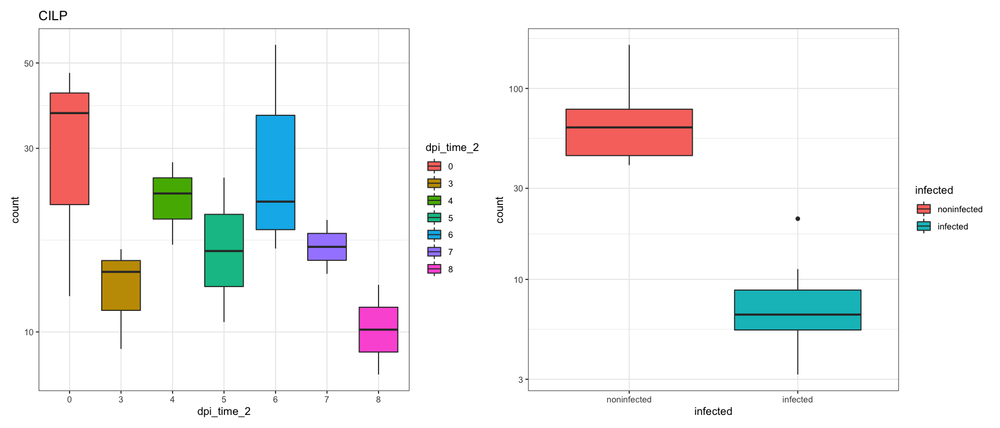

In [68]:
options(repr.plot.width=14, repr.plot.height=6)
plotCounts(dds_simple, gene="ENSMMUG00000056548.1", intgroup = "dpi_time_2", returnData = TRUE) %>%
  ggplot() + aes(dpi_time_2, count) + geom_boxplot(aes(fill=dpi_time_2)) + scale_y_log10() + theme_bw() + ggtitle("CILP")| plotCounts(dds_simple, gene="ENSMMUG00000009659.4", intgroup = "infected", returnData = TRUE) %>%
  ggplot() + aes(infected, count) + geom_boxplot(aes(fill=infected)) + scale_y_log10() + theme_bw()

,tissue,n.genes
,<chr>,<int>
Spleen,Spleen,267
Kidney,Kidney,422
Liver,Liver,5
Brain:Brain-Gr,Brain:Brain-Gr,88
Sex Organ:Ovary,Sex Organ:Ovary,141
Lymph node:LN-AX-R,Lymph node:LN-AX-R,116
Lymph node:LN-ING-L,Lymph node:LN-ING-L,88
Lymph node:LN-MES,Lymph node:LN-MES,68
Sex Organ:Sex-Organ,Sex Organ:Sex-Organ,35


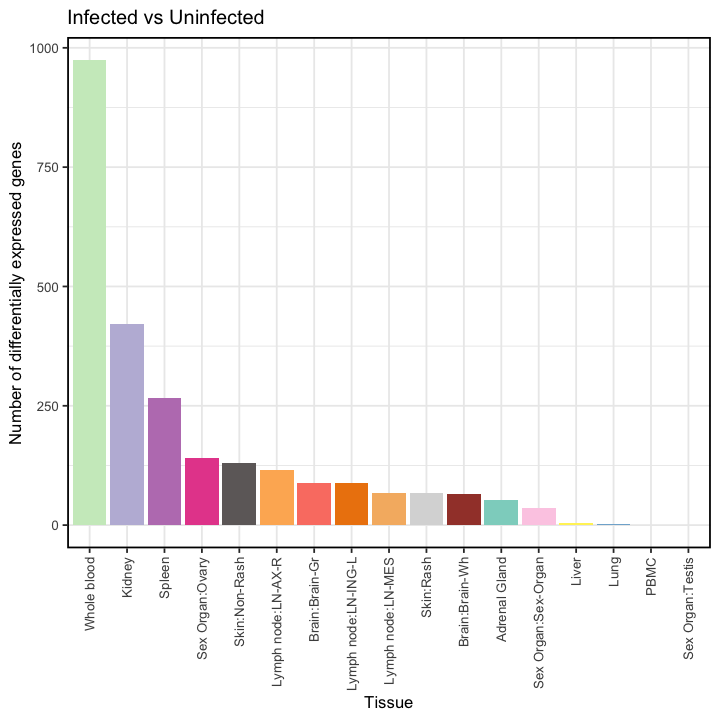

In [13]:
de.genes.all.tissues <- lapply(marker.genes, function(x) {
    xp <- x[NA2FALSE(x$padj < 0.05),]
   xp <- xp[NA2FALSE(xp$log2FoldChange > 2),]
    

    unique(rownames(xp))
    
})

n.de.per.tissue <- unlist(lapply(de.genes.all.tissues, length))
n.de.df.plot <- data.frame(
    tissue = names(n.de.per.tissue),
    n.genes = n.de.per.tissue
)

n.de.df.plot

#n.de.df.plot<-n.de.df.plot[!rownames(n.de.df.plot) %in% c("Lung","Sex Organ:Testis","Liver","PBMC"),]
options(repr.plot.width=6, repr.plot.height=6)
P1<-ggplot(n.de.df.plot, aes(x=fct_reorder(tissue, desc(n.genes)),y=n.genes,fill=tissue)) +
    geom_bar(stat='identity') + scale_fill_manual(values = color_ft)+
    theme_bw() + ylab("Number of differentially expressed genes")+
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) + 
    scale_x_discrete("Tissue") + ggtitle("Infected vs Uninfected")+
 theme(text=element_text(size=10,color='black'),panel.border = element_rect(colour = "black", fill=NA, size=1))
barp<-P1+NoLegend()
ggsave("../Barplot.pdf",width=14,height=15)
barp

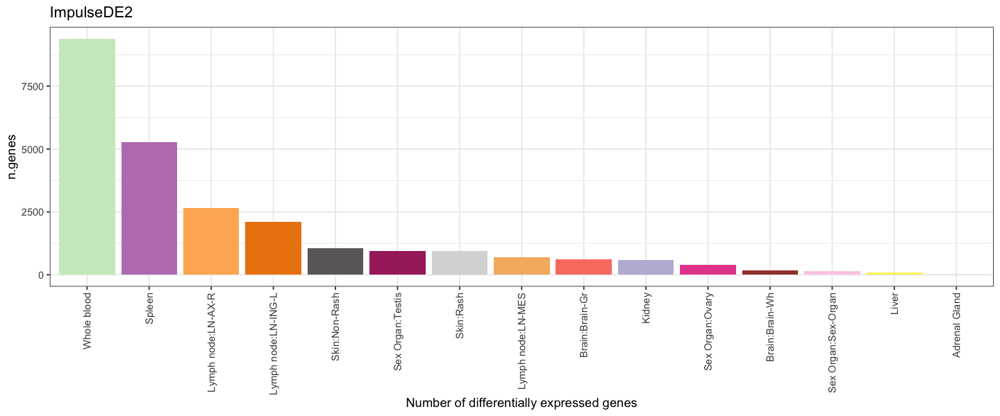

In [48]:
de.genes.all.tissues <- lapply(genes.ImpulseDE2.fulltissue, function(x) {
    xp <- x[NA2FALSE(x$padj < 0.05),]
     
    unique(rownames(xp))
})

n.de.per.tissue <- unlist(lapply(de.genes.all.tissues, length))
n.de.df.plot <- data.frame(
    tissue = names(n.de.per.tissue),
    n.genes = n.de.per.tissue
)
options(repr.plot.width=6, repr.plot.height=6)
Bar<-ggplot(n.de.df.plot %>% filter(!tissue %in% c("PBMC","Lung")), aes(x=fct_reorder(tissue, desc(n.genes)),y=n.genes,fill=tissue)) +
    geom_bar(stat='identity')+
    theme_bw() + scale_fill_manual(values = color_ft)+ 
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) + 
    scale_x_discrete("Number of differentially expressed genes")+ ggtitle("ImpulseDE2")+NoLegend()
library(patchwork)
options(repr.plot.width=12,repr.plot.height=5)
Bar

In [17]:
tissue.marker.full<-readRDS("../06-tissue-specific-markers/marker.genes.full.bind.rds")
tissue.marker <- tissue.marker.full %>% group_by(tissue) %>% top_n(30, log2FoldChange)
as.data.frame(marker.genes[["Spleen"]])
head(tissue.marker %>% filter(tissue=="Liver"))

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSMMUG00000023296.4,6.96244769,-0.137995840,0.3840561,-0.359311690,0.71936193,0.8603949
ENSMMUG00000036181.3,0.39238514,1.400427970,1.4386950,0.973401601,0.33035374,NA
ENSMMUG00000000634.4,235.80602174,-0.772138003,0.4435285,-1.740898210,0.08170142,0.2910903
ENSMMUG00000037875.2,49.68141677,-0.473132297,0.2305636,-2.052068520,0.04016300,0.2162451
ENSMMUG00000000632.4,175.21339964,-0.564572270,0.3177307,-1.776889522,0.07558642,0.2802816
ENSMMUG00000064799.1,0.21748407,-1.173902187,1.8033351,-0.650961756,0.51507117,NA
ENSMMUG00000057389.1,8.64287594,-0.097053663,0.9836844,-0.098663418,0.92140552,0.9635260
ENSMMUG00000031200.3,42.41470824,1.140580723,0.9160247,1.245141932,0.21307958,0.4642480
ENSMMUG00000052613.1,27.37281491,-0.006882495,0.9354227,-0.007357631,0.99412951,0.9973294


tissue,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Geneid,Chr,Start,⋯,dispMAP,Intercept,SE_Intercept,WaldStatistic_Intercept,WaldPvalue_Intercept,betaConv,betaIter,deviance,maxCooks,replace
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>,<lgl>,<lgl>
Liver,1364.1683,13.72607,0.6033570,22.74951,1.451284e-114,1.347457e-111,ENSMMUG00000008015.4,chr15;chr15;chr15;chr15;chr15;chr15,28519326;28520054;28520365;28521176;28521444;28522005,⋯,8.537413,7.669956,0.2403563,31.91077,1.892789e-223,TRUE,1,2246.206,NA,TRUE
Liver,2284.2652,16.46040,0.7836854,21.00383,6.050336e-98,4.085444e-95,ENSMMUG00000060306.1,chr14;chr14;chr14;chr14,47325962;47326494;47328777;47329311,⋯,12.024412,8.611767,0.2851282,30.20315,2.153650e-200,TRUE,1,1955.421,NA,TRUE
Liver,683.9034,15.25008,0.7335644,20.78901,5.442351e-96,3.368664e-93,ENSMMUG00000007725.3,chr14;chr14;chr14;chr14;chr14;chr14;chr14;chr14;chr14;chr14,59500676;59500909;59501081;59501333;59503094;59503954;59504429;59509545;59509759;59510061,⋯,12.952799,7.305431,0.2960262,24.67832,1.827970e-134,TRUE,1,1628.598,NA,TRUE
Liver,382.6140,13.38500,0.6993493,19.13922,1.190446e-81,4.653810e-79,ENSMMUG00000018634.4,chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9;chr9,57871413;57871687;57875608;57875608;57877127;57877127;57880435;57880435;57880925;57880925;57884603;57884603;57885988;57885988;57886533;57886533;57887298;57910837,⋯,9.023492,5.455305,0.2476501,22.02828,1.543294e-107,TRUE,1,1680.586,NA,TRUE
Liver,1341.3604,15.88314,0.9014606,17.61934,1.750222e-69,4.382045e-67,ENSMMUG00000011218.4,chr7;chr7;chr7;chr7;chr7,156782245;156784252;156789405;156792486;156793873,⋯,6.105541,8.092771,0.2032671,39.81349,0.000000e+00,TRUE,1,3099.220,NA,TRUE
Liver,475.2723,14.93822,0.8892721,16.79826,2.513271e-63,4.869844e-61,ENSMMUG00000008559.4,chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15;chr15,28775366;28775366;28777021;28777703;28777703;28777703;28779395;28779395;28779395;28780287;28780287;28780287;28781417;28781417;28781417;28784565;28784565;28784565;28791460;28791460;28791460;28792629;28792629;28792629;28793121;28793121;28793121;28793939;28793939,⋯,16.639318,5.451592,0.3358604,16.23172,3.009144e-59,TRUE,1,1141.835,NA,TRUE


In [18]:
genes.ImpulseDE2<- lapply(genes.ImpulseDE2.fulltissue, function(x) {
    a<-as.data.frame(x)
    a$Gene<-rownames(a)
    a
})

genes.Infection<- lapply(names(marker.genes), function(tissue) {
    x<-marker.genes[[tissue]]
    a<-as.data.frame(x)
    a$Gene<-rownames(a)
    marker<-tissue.marker %>% filter(tissue==tissue)
    a$Marker<-ifelse(a$Gene %in% unique(marker$Geneid),TRUE,FALSE)
    a
})

names(genes.Infection)<-names(marker.genes)

de.genes.Impulse<-bind_rows(genes.ImpulseDE2, .id = "tissue")
de.genes.Infection<-bind_rows(genes.Infection, .id = "tissue")
head(de.genes.Impulse)
head(de.genes.Infection)

,tissue,Gene,p,padj,loglik_full,loglik_red,df_full,df_red,mean,converge_impulse,converge_const,converge_sigmoid,impulseTOsigmoid_p,impulseTOsigmoid_padj,sigmoidTOconst_p,sigmoidTOconst_padj,isTransient,isMonotonous,allZero
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<lgl>
ENSMMUG00000023296.4...1,Spleen,ENSMMUG00000023296.4,0.97155590,0.999999999,-64.40096,-64.84164,7,2,14.8310277,0,0,0,0.8266847,1,9.187369e-01,1.0000000000,FALSE,FALSE,FALSE
ENSMMUG00000036181.3...2,Spleen,ENSMMUG00000036181.3,0.61583879,0.999999999,-26.23131,-28.00630,7,2,0.9154542,0,0,0,0.4015873,1,6.313193e-01,0.9754428096,FALSE,FALSE,FALSE
ENSMMUG00000000634.4...3,Spleen,ENSMMUG00000000634.4,0.00025774,0.002891308,-128.57967,-140.38564,7,2,486.7697685,0,0,0,0.8632546,1,3.466792e-05,0.0004651504,FALSE,TRUE,FALSE
ENSMMUG00000037875.2...4,Spleen,ENSMMUG00000037875.2,0.52533284,0.980625760,-93.15043,-95.23499,7,2,102.3669930,0,0,0,0.7747125,1,3.007681e-01,0.6510603570,FALSE,FALSE,FALSE
ENSMMUG00000000632.4...5,Spleen,ENSMMUG00000000632.4,0.05136080,0.194512263,-120.95887,-126.45935,7,2,359.8970535,0,0,0,0.7674755,1,1.495431e-02,0.0649098601,FALSE,FALSE,FALSE
ENSMMUG00000064799.1...6,Spleen,ENSMMUG00000064799.1,0.58702700,0.999999999,-20.53467,-22.40601,7,2,0.4898855,0,0,0,0.8703869,1,3.253253e-01,0.6860717248,FALSE,FALSE,FALSE


,tissue,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Gene,Marker
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>
ENSMMUG00000023296.4...1,Spleen,6.9624477,-0.1379958,0.3840561,-0.3593117,0.71936193,0.8603949,ENSMMUG00000023296.4,FALSE
ENSMMUG00000036181.3...2,Spleen,0.3923851,1.4004280,1.4386950,0.9734016,0.33035374,NA,ENSMMUG00000036181.3,FALSE
ENSMMUG00000000634.4...3,Spleen,235.8060217,-0.7721380,0.4435285,-1.7408982,0.08170142,0.2910903,ENSMMUG00000000634.4,FALSE
ENSMMUG00000037875.2...4,Spleen,49.6814168,-0.4731323,0.2305636,-2.0520685,0.04016300,0.2162451,ENSMMUG00000037875.2,FALSE
ENSMMUG00000000632.4...5,Spleen,175.2133996,-0.5645723,0.3177307,-1.7768895,0.07558642,0.2802816,ENSMMUG00000000632.4,FALSE
ENSMMUG00000064799.1...6,Spleen,0.2174841,-1.1739022,1.8033351,-0.6509618,0.51507117,NA,ENSMMUG00000064799.1,FALSE


In [19]:
LN<-as.data.frame(genes.Infection$`Lymph node:LN-AX-R`)
LN %>% filter(rownames(LN) =="ENSMMUG00000009659.4")

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,Gene,Marker
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>
ENSMMUG00000009659.4,43.19662,-0.3055864,0.9531498,-0.3206069,0.7485083,0.9539334,ENSMMUG00000009659.4,FALSE


In [20]:
table(de.genes.Infection$tissue)
dim(de.genes.Infection)
table(de.genes.Impulse$tissue)
dim(de.genes.Impulse)
colnames(de.genes.Infection)<-c(colnames(de.genes.Infection)[1],
                                paste0("Infection.",colnames(de.genes.Infection)[2:7]),"Gene","Marker")

head(de.genes.Impulse$Gene)
head(de.genes.Infection$Gene)
table(de.genes.Impulse$Gene %in% de.genes.Infection$Gene)

de.genes.Infection<-de.genes.Infection %>% filter(!is.na(de.genes.Infection$Gene))
de.genes.Impulse<-de.genes.Impulse %>% filter(!is.na(de.genes.Impulse$Gene) & (de.genes.Impulse$Gene %in% unique(de.genes.Infection$Gene)))

table(de.genes.Infection$tissue)
dim(de.genes.Infection)
table(de.genes.Impulse$tissue)
dim(de.genes.Impulse)


      Adrenal Gland      Brain:Brain-Gr      Brain:Brain-Wh              Kidney 
              35395               35395               35395               35395 
              Liver                Lung  Lymph node:LN-AX-R Lymph node:LN-ING-L 
              35395               35395               35395               35395 
  Lymph node:LN-MES                PBMC     Sex Organ:Ovary Sex Organ:Sex-Organ 
              35395               35395               35395               35395 
   Sex Organ:Testis       Skin:Non-Rash           Skin:Rash              Spleen 
              35395               35395               35395               35395 
        Whole blood 
              35395 

[1] 601715      9


      Adrenal Gland      Brain:Brain-Gr      Brain:Brain-Wh              Kidney 
              35405               35405               35405               35405 
              Liver                Lung  Lymph node:LN-AX-R Lymph node:LN-ING-L 
              35405               35405               35405               35405 
  Lymph node:LN-MES                PBMC     Sex Organ:Ovary Sex Organ:Sex-Organ 
              35405               35405               35405               35405 
   Sex Organ:Testis       Skin:Non-Rash           Skin:Rash              Spleen 
              35405               35405               35405               35405 
        Whole blood 
              35405 

[1] 601885     19

[1] "ENSMMUG00000023296.4" "ENSMMUG00000036181.3" "ENSMMUG00000000634.4"
[4] "ENSMMUG00000037875.2" "ENSMMUG00000000632.4" "ENSMMUG00000064799.1"

[1] "ENSMMUG00000023296.4" "ENSMMUG00000036181.3" "ENSMMUG00000000634.4"
[4] "ENSMMUG00000037875.2" "ENSMMUG00000000632.4" "ENSMMUG00000064799.1"


 FALSE   TRUE 
   170 601715 


      Adrenal Gland      Brain:Brain-Gr      Brain:Brain-Wh              Kidney 
              35395               35395               35395               35395 
              Liver                Lung  Lymph node:LN-AX-R Lymph node:LN-ING-L 
              35395               35395               35395               35395 
  Lymph node:LN-MES                PBMC     Sex Organ:Ovary Sex Organ:Sex-Organ 
              35395               35395               35395               35395 
   Sex Organ:Testis       Skin:Non-Rash           Skin:Rash              Spleen 
              35395               35395               35395               35395 
        Whole blood 
              35395 

[1] 601715      9


      Adrenal Gland      Brain:Brain-Gr      Brain:Brain-Wh              Kidney 
              35395               35395               35395               35395 
              Liver                Lung  Lymph node:LN-AX-R Lymph node:LN-ING-L 
              35395               35395               35395               35395 
  Lymph node:LN-MES                PBMC     Sex Organ:Ovary Sex Organ:Sex-Organ 
              35395               35395               35395               35395 
   Sex Organ:Testis       Skin:Non-Rash           Skin:Rash              Spleen 
              35395               35395               35395               35395 
        Whole blood 
              35395 

[1] 601715     19

In [176]:
colnames(de.genes.Impulse)
colnames(de.genes.Infection)

[1] "tissue"                "Gene"                  "p"                    
 [4] "padj"                  "loglik_full"           "loglik_red"           
 [7] "df_full"               "df_red"                "mean"                 
[10] "converge_impulse"      "converge_const"        "converge_sigmoid"     
[13] "impulseTOsigmoid_p"    "impulseTOsigmoid_padj" "sigmoidTOconst_p"     
[16] "sigmoidTOconst_padj"   "isTransient"           "isMonotonous"         
[19] "allZero"

[1] "tissue"                   "Infection.baseMean"      
[3] "Infection.log2FoldChange" "Infection.lfcSE"         
[5] "Infection.stat"           "Infection.pvalue"        
[7] "Infection.padj"           "Gene"                    
[9] "Marker"

In [21]:
rownames(de.genes.Infection)<-paste0(de.genes.Infection$Gene,".",de.genes.Infection$tissue)
rownames(de.genes.Impulse)<-paste0(de.genes.Impulse$Gene,".",de.genes.Impulse$tissue)
head(de.genes.Infection)
DE.Compiled<-cbind(de.genes.Impulse,de.genes.Infection)
head(DE.Compiled)

,tissue,Infection.baseMean,Infection.log2FoldChange,Infection.lfcSE,Infection.stat,Infection.pvalue,Infection.padj,Gene,Marker
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>
ENSMMUG00000023296.4.Spleen,Spleen,6.9624477,-0.1379958,0.3840561,-0.3593117,0.71936193,0.8603949,ENSMMUG00000023296.4,FALSE
ENSMMUG00000036181.3.Spleen,Spleen,0.3923851,1.4004280,1.4386950,0.9734016,0.33035374,NA,ENSMMUG00000036181.3,FALSE
ENSMMUG00000000634.4.Spleen,Spleen,235.8060217,-0.7721380,0.4435285,-1.7408982,0.08170142,0.2910903,ENSMMUG00000000634.4,FALSE
ENSMMUG00000037875.2.Spleen,Spleen,49.6814168,-0.4731323,0.2305636,-2.0520685,0.04016300,0.2162451,ENSMMUG00000037875.2,FALSE
ENSMMUG00000000632.4.Spleen,Spleen,175.2133996,-0.5645723,0.3177307,-1.7768895,0.07558642,0.2802816,ENSMMUG00000000632.4,FALSE
ENSMMUG00000064799.1.Spleen,Spleen,0.2174841,-1.1739022,1.8033351,-0.6509618,0.51507117,NA,ENSMMUG00000064799.1,FALSE


,tissue,Gene,p,padj,loglik_full,loglik_red,df_full,df_red,mean,converge_impulse,⋯,allZero,tissue,Infection.baseMean,Infection.log2FoldChange,Infection.lfcSE,Infection.stat,Infection.pvalue,Infection.padj,Gene,Marker
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,⋯,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>
ENSMMUG00000023296.4.Spleen,Spleen,ENSMMUG00000023296.4,0.97155590,0.999999999,-64.40096,-64.84164,7,2,14.8310277,0,⋯,FALSE,Spleen,6.9624477,-0.1379958,0.3840561,-0.3593117,0.71936193,0.8603949,ENSMMUG00000023296.4,FALSE
ENSMMUG00000036181.3.Spleen,Spleen,ENSMMUG00000036181.3,0.61583879,0.999999999,-26.23131,-28.00630,7,2,0.9154542,0,⋯,FALSE,Spleen,0.3923851,1.4004280,1.4386950,0.9734016,0.33035374,NA,ENSMMUG00000036181.3,FALSE
ENSMMUG00000000634.4.Spleen,Spleen,ENSMMUG00000000634.4,0.00025774,0.002891308,-128.57967,-140.38564,7,2,486.7697685,0,⋯,FALSE,Spleen,235.8060217,-0.7721380,0.4435285,-1.7408982,0.08170142,0.2910903,ENSMMUG00000000634.4,FALSE
ENSMMUG00000037875.2.Spleen,Spleen,ENSMMUG00000037875.2,0.52533284,0.980625760,-93.15043,-95.23499,7,2,102.3669930,0,⋯,FALSE,Spleen,49.6814168,-0.4731323,0.2305636,-2.0520685,0.04016300,0.2162451,ENSMMUG00000037875.2,FALSE
ENSMMUG00000000632.4.Spleen,Spleen,ENSMMUG00000000632.4,0.05136080,0.194512263,-120.95887,-126.45935,7,2,359.8970535,0,⋯,FALSE,Spleen,175.2133996,-0.5645723,0.3177307,-1.7768895,0.07558642,0.2802816,ENSMMUG00000000632.4,FALSE
ENSMMUG00000064799.1.Spleen,Spleen,ENSMMUG00000064799.1,0.58702700,0.999999999,-20.53467,-22.40601,7,2,0.4898855,0,⋯,FALSE,Spleen,0.2174841,-1.1739022,1.8033351,-0.6509618,0.51507117,NA,ENSMMUG00000064799.1,FALSE


In [19]:
#write.csv(DE.Compiled,"DE_Compiled.csv")

In [22]:
dd<-dds.qc.experimental.alltp
suppressPackageStartupMessages(library(org.Mmu.eg.db))
suppressPackageStartupMessages(library(GO.db))
suppressPackageStartupMessages(library(AnnotationDbi))
go.db.df <- select(GO.db,keys=keys(GO.db),columns = columns(GO.db))
terms <- go.db.df$TERM
terms
term_sel <- grepl("cytokine",terms) & !(grepl("cytokinesis",terms))
cytokine.go.pathways <- go.db.df[term_sel,]
cytokine_go_id <- cytokine.go.pathways$GOID
getGenesInGOpathways <- function(goids) {
    unique(AnnotationDbi::select(org.Mmu.eg.db, keytype='GOALL', keys=goids, columns=c("ENSEMBL"))$ENSEMBL)
}
cytokine.genes <- getGenesInGOpathways(cytokine_go_id)


length(cytokine.genes)
transcript.gene<-rowData(dd)$Geneid
names(transcript.gene) <- nbHelpers::strpart(rownames(rowData(dd)),'.',fixed=T,1)
head(transcript.gene)
cytokine.genes<-transcript.gene[cytokine.genes]
names(cytokine.genes)<-NULL

go.db.df <- select(GO.db,keys=keys(GO.db),columns = columns(GO.db))
apoptosis.go.pathways <- go.db.df[grep("apoptosis",go.db.df$TERM),]
apotosis_go_id <- apoptosis.go.pathways$GOID
apoptosis.genes <- select(org.Mmu.eg.db, keytype='GOALL', keys=apotosis_go_id, columns=c("ENSEMBL"))$ENSEMBL
length(apoptosis.genes)
transcript.gene<-rowData(dd)$Geneid
names(transcript.gene) <- nbHelpers::strpart(rownames(rowData(dd)),'.',fixed=T,1)
head(transcript.gene)
apoptosis.genes<-transcript.gene[apoptosis.genes]
names(apoptosis.genes)<-NULL


go.db.df <- select(GO.db,keys=keys(GO.db),columns = columns(GO.db))
apoptosis.go.pathways <- go.db.df[grep("inflammatory response",go.db.df$TERM),]
inflam_go_id <- apoptosis.go.pathways$GOID
inflam.genes <- select(org.Mmu.eg.db, keytype='GOALL', keys=inflam_go_id, columns=c("ENSEMBL"))$ENSEMBL
length(inflam.genes)
transcript.gene<-rowData(dd)$Geneid
names(transcript.gene) <- nbHelpers::strpart(rownames(rowData(dd)),'.',fixed=T,1)
head(transcript.gene)
inflam.genes<-transcript.gene[inflam.genes]
names(inflam.genes)<-NULL



go.db.df <- select(GO.db,keys=keys(GO.db),columns = columns(GO.db))
apoptosis.go.pathways <- go.db.df[grep("extracellular matrix",go.db.df$TERM),]
extraecllular_go_id <- apoptosis.go.pathways$GOID
extraecllular.genes <- select(org.Mmu.eg.db, keytype='GOALL', keys=extraecllular_go_id, columns=c("ENSEMBL"))$ENSEMBL
length(extraecllular.genes)
transcript.gene<-rowData(dd)$Geneid
names(transcript.gene) <- nbHelpers::strpart(rownames(rowData(dd)),'.',fixed=T,1)
head(transcript.gene)
extraecllular.genes<-transcript.gene[extraecllular.genes]
names(extraecllular.genes)<-NULL



parp.names <- c("PARP14", "PARP9", "PARP12", "PARP3", "PARP2", "PARP15", "PARP1", 
"PARP8", "PARP6", "PARP11", "PARP16", "ZC3HAV1")

parp.genes <- rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% parp.names]


# this is the list of isg genes from the single-cell paper
isg.set.for.scoring.fromSC <- c("ADAR","APOBEC3G","APOL6","B2M","BANK1","CASP1","DDX58",
                                "DDX60","DDX60L","DHX58","EIF2AK2","EPSTI1","FAS","GBP2",
                                "HERC5","HERC6","HIF1A","IFI16","IFI27","IFI35","IFI44",
                                "IFI6","IFIH1","IFIT3","IRF7","IRF9","ISG15","ISG20",
                                "LGALS3BP","MX1","MX2","NFKBIA","NMI","OAS2","OAS3","PARP14",
                                "PARP9","PML","PSMB8","PSMB9","PSME2","PTPN1","RARRES3","RSAD2",
                                "SAMD9","SAMD9L","SAMHD1","SP100","STAT1","STAT3","TRIM22","TRIM25",
                                "TRIM5","UBE2L6","VAMP5","WARS","XAF1","ZNFX1")

Isg<-read.csv(file = "ISG.csv",header = FALSE)[,1]
isg.names<-unique(c(Isg,isg.set.for.scoring.fromSC))
isg.genes <- rowData(dd)$Geneid[rowData(dd)$external_gene_name %in% isg.names]
isg.genes
cytokine.genes
apoptosis.genes
inflam.genes
extraecllular.genes

'select()' returned 1:1 mapping between keys and columns



[1] "mitochondrion inheritance"                                                                                                                                                                  
    [2] "mitochondrial genome maintenance"                                                                                                                                                           
    [3] "reproduction"                                                                                                                                                                               
    [4] "high-affinity zinc transmembrane transporter activity"                                                                                                                                      
    [5] "low-affinity zinc ion transmembrane transporter activity"                                                                                                                                   
    [6] "alpha-1,6-mannosyltransferase activity"                                                                                                                                                     
    [7] "trans-hexaprenyltranstransferase activity"                                                                                                                                                  
    [8] "vacuole inheritance"                                                                                                                                                                        
    [9] "single strand break repair"                                                                                                                                                                 
   [10] "single-stranded DNA endodeoxyribonuclease activity"                                                                                                                                         
   [11] "phosphopyruvate hydratase complex"                                                                                                                                                          
   [12] "lactase activity"                                                                                                                                                                           
   [13] "alpha-glucoside transport"                                                                                                                                                                  
   [14] "regulation of DNA recombination"                                                                                                                                                            
   [15] "regulation of mitotic recombination"                                                                                                                                                        
   [16] "mitotic spindle elongation"                                                                                                                                                                 
   [17] "maltose metabolic process"                                                                                                                                                                  
   [18] "maltose biosynthetic process"                                                                                                                                                               
   [19] "maltose catabolic process"                                                                                                                                                                  
   [20] "alpha-1,2-mannosyltransferase activity"                                                                                                                                                     
   [21] "ribosomal large subunit assembly"  

'select()' returned 1:many mapping between keys and columns



[1] 625

Warning message:
“replacing previous import ‘Rcpp::prompt’ by ‘utils::prompt’ when loading ‘nbHelpers’”
Warning message:
“replacing previous import ‘Rcpp::.DollarNames’ by ‘utils::.DollarNames’ when loading ‘nbHelpers’”
Warning message:
“replacing previous import ‘Matrix::tail’ by ‘utils::tail’ when loading ‘nbHelpers’”
Warning message:
“replacing previous import ‘Matrix::head’ by ‘utils::head’ when loading ‘nbHelpers’”


ENSMMUG00000023296     ENSMMUG00000036181     ENSMMUG00000000634 
"ENSMMUG00000023296.4" "ENSMMUG00000036181.3" "ENSMMUG00000000634.4" 
    ENSMMUG00000037875     ENSMMUG00000000632     ENSMMUG00000064799 
"ENSMMUG00000037875.2" "ENSMMUG00000000632.4" "ENSMMUG00000064799.1"

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



[1] 67

ENSMMUG00000023296     ENSMMUG00000036181     ENSMMUG00000000634 
"ENSMMUG00000023296.4" "ENSMMUG00000036181.3" "ENSMMUG00000000634.4" 
    ENSMMUG00000037875     ENSMMUG00000000632     ENSMMUG00000064799 
"ENSMMUG00000037875.2" "ENSMMUG00000000632.4" "ENSMMUG00000064799.1"

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



[1] 726

ENSMMUG00000023296     ENSMMUG00000036181     ENSMMUG00000000634 
"ENSMMUG00000023296.4" "ENSMMUG00000036181.3" "ENSMMUG00000000634.4" 
    ENSMMUG00000037875     ENSMMUG00000000632     ENSMMUG00000064799 
"ENSMMUG00000037875.2" "ENSMMUG00000000632.4" "ENSMMUG00000064799.1"

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:many mapping between keys and columns



[1] 466

ENSMMUG00000023296     ENSMMUG00000036181     ENSMMUG00000000634 
"ENSMMUG00000023296.4" "ENSMMUG00000036181.3" "ENSMMUG00000000634.4" 
    ENSMMUG00000037875     ENSMMUG00000000632     ENSMMUG00000064799 
"ENSMMUG00000037875.2" "ENSMMUG00000000632.4" "ENSMMUG00000064799.1"

[1] "ENSMMUG00000023569.4" "ENSMMUG00000008922.4" "ENSMMUG00000004490.4"
  [4] "ENSMMUG00000016093.4" "ENSMMUG00000002350.4" "ENSMMUG00000018566.4"
  [7] "ENSMMUG00000011454.4" "ENSMMUG00000018911.4" "ENSMMUG00000050757.1"
 [10] "ENSMMUG00000019302.4" "ENSMMUG00000000995.4" "ENSMMUG00000012263.4"
 [13] "ENSMMUG00000022569.4" "ENSMMUG00000016381.4" "ENSMMUG00000000912.4"
 [16] "ENSMMUG00000016367.4" "ENSMMUG00000020903.3" "ENSMMUG00000010314.4"
 [19] "ENSMMUG00000010316.4" "ENSMMUG00000008441.4" "ENSMMUG00000019092.4"
 [22] "ENSMMUG00000001880.4" "ENSMMUG00000003634.4" "ENSMMUG00000015087.4"
 [25] "ENSMMUG00000021762.4" "ENSMMUG00000015329.4" "ENSMMUG00000044257.2"
 [28] "ENSMMUG00000003961.4" "ENSMMUG00000003956.4" "ENSMMUG00000019983.3"
 [31] "ENSMMUG00000020803.4" "ENSMMUG00000000170.4" "ENSMMUG00000014122.4"
 [34] "ENSMMUG00000006779.4" "ENSMMUG00000018478.4" "ENSMMUG00000008100.4"
 [37] "ENSMMUG00000004577.4" "ENSMMUG00000011304.4" "ENSMMUG00000011301.4"
 [40] "ENSMMUG00000050761.1" "ENSMMUG00000060797.1" "ENSMMUG00000002569.4"
 [43] "ENSMMUG00000007669.4" "ENSMMUG00000012473.4" "ENSMMUG00000040817.2"
 [46] "ENSMMUG00000020374.4" "ENSMMUG00000021002.4" "ENSMMUG00000023780.4"
 [49] "ENSMMUG00000011752.4" "ENSMMUG00000014254.4" "ENSMMUG00000014255.4"
 [52] "ENSMMUG00000011426.4" "ENSMMUG00000007585.4" "ENSMMUG00000008303.4"
 [55] "ENSMMUG00000061761.1" "ENSMMUG00000005001.4" "ENSMMUG00000017533.4"
 [58] "ENSMMUG00000000798.4" "ENSMMUG00000050457.1" "ENSMMUG00000000803.4"
 [61] "ENSMMUG00000012782.4" "ENSMMUG00000046639.2" "ENSMMUG00000008505.4"
 [64] "ENSMMUG00000017781.4" "ENSMMUG00000005613.4" "ENSMMUG00000016575.4"
 [67] "ENSMMUG00000049915.1" "ENSMMUG00000004014.4" "ENSMMUG00000001332.4"
 [70] "ENSMMUG00000000338.4" "ENSMMUG00000000335.4" "ENSMMUG00000009852.4"
 [73] "ENSMMUG00000008670.4" "ENSMMUG00000012442.4" "ENSMMUG00000058193.1"
 [76] "ENSMMUG00000019067.4" "ENSMMUG00000014558.4" "ENSMMUG00000001936.4"
 [79] "ENSMMUG00000058122.1" "ENSMMUG00000037522.2" "ENSMMUG00000015969.3"
 [82] "ENSMMUG00000039346.2" "ENSMMUG00000001050.4" "ENSMMUG00000002091.4"
 [85] "ENSMMUG00000023623.4" "ENSMMUG00000007878.4" "ENSMMUG00000014926.4"
 [88] "ENSMMUG00000009602.4" "ENSMMUG00000010083.4" "ENSMMUG00000000288.4"
 [91] "ENSMMUG00000054796.1" "ENSMMUG00000005790.4" "ENSMMUG00000014755.4"
 [94] "ENSMMUG00000010707.4" "ENSMMUG00000015999.3" "ENSMMUG00000019662.4"
 [97] "ENSMMUG00000007777.4" "ENSMMUG00000010956.3" "ENSMMUG00000014163.4"
[100] "ENSMMUG00000011042.4" "ENSMMUG00000003110.4" "ENSMMUG00000005829.4"
[103] "ENSMMUG00000051543.1" "ENSMMUG00000022735.4"

[1] "ENSMMUG00000001711.4" "ENSMMUG00000062394.1" "ENSMMUG00000013773.4"
  [4] "ENSMMUG00000002684.4" "ENSMMUG00000022577.4" "ENSMMUG00000003133.4"
  [7] "ENSMMUG00000056408.1" "ENSMMUG00000016754.4" "ENSMMUG00000015847.4"
 [10] "ENSMMUG00000014254.4" "ENSMMUG00000014255.4" "ENSMMUG00000042946.2"
 [13] "ENSMMUG00000008624.4" "ENSMMUG00000000870.4" "ENSMMUG00000002418.4"
 [16] "ENSMMUG00000018679.4" "ENSMMUG00000002192.4" "ENSMMUG00000019304.4"
 [19] "ENSMMUG00000016915.4" "ENSMMUG00000021762.4" "ENSMMUG00000012263.4"
 [22] "ENSMMUG00000047685.2" "ENSMMUG00000015689.4" "ENSMMUG00000012321.4"
 [25] "ENSMMUG00000062832.1" "ENSMMUG00000052649.1" "ENSMMUG00000011752.4"
 [28] "ENSMMUG00000012048.4" "ENSMMUG00000017781.4" "ENSMMUG00000004194.3"
 [31] "ENSMMUG00000023569.4" "ENSMMUG00000016167.4" "ENSMMUG00000018972.3"
 [34] "ENSMMUG00000017204.4" "ENSMMUG00000015348.4" "ENSMMUG00000016723.4"
 [37] "ENSMMUG00000020725.4" "ENSMMUG00000003571.4" "ENSMMUG00000030531.3"
 [40] "ENSMMUG00000041307.2" "ENSMMUG00000023256.4" "ENSMMUG00000052851.1"
 [43] "ENSMMUG00000021628.4" "ENSMMUG00000014141.4" "ENSMMUG00000050712.1"
 [46] "ENSMMUG00000010173.4" "ENSMMUG00000014235.4" "ENSMMUG00000059267.1"
 [49] "ENSMMUG00000001649.4" "ENSMMUG00000003018.4" "ENSMMUG00000012746.3"
 [52] "ENSMMUG00000007969.4" "ENSMMUG00000011852.3" "ENSMMUG00000017745.4"
 [55] "ENSMMUG00000003187.4" "ENSMMUG00000010866.4" "ENSMMUG00000004503.4"
 [58] "ENSMMUG00000016982.4" "ENSMMUG00000061872.1" "ENSMMUG00000022403.4"
 [61] "ENSMMUG00000010007.4" "ENSMMUG00000010199.4" "ENSMMUG00000058889.1"
 [64] "ENSMMUG00000003373.4" "ENSMMUG00000023437.4" "ENSMMUG00000059191.1"
 [67] "ENSMMUG00000022523.4" "ENSMMUG00000005322.4" "ENSMMUG00000021659.3"
 [70] "ENSMMUG00000003947.4" "ENSMMUG00000007490.4" "ENSMMUG00000000156.4"
 [73] "ENSMMUG00000004014.4" "ENSMMUG00000019092.4" "ENSMMUG00000009869.4"
 [76] "ENSMMUG00000005448.4" "ENSMMUG00000050757.1" "ENSMMUG00000020025.4"
 [79] "ENSMMUG00000002569.4" "ENSMMUG00000007683.4" "ENSMMUG00000002678.4"
 [82] "ENSMMUG00000023008.4" "ENSMMUG00000013875.4" "ENSMMUG00000021478.4"
 [85] "ENSMMUG00000011308.4" "ENSMMUG00000021412.4" "ENSMMUG00000043913.2"
 [88] "ENSMMUG00000013359.4" "ENSMMUG00000006071.4" "ENSMMUG00000047198.2"
 [91] NA                     "ENSMMUG00000005946.4" "ENSMMUG00000000857.4"
 [94] "ENSMMUG00000015168.4" "ENSMMUG00000023491.4" "ENSMMUG00000018334.3"
 [97] "ENSMMUG00000020289.4" "ENSMMUG00000017969.4" "ENSMMUG00000019591.4"
[100] "ENSMMUG00000021825.4" "ENSMMUG00000010402.4" "ENSMMUG00000016890.4"
[103] "ENSMMUG00000006994.4" "ENSMMUG00000058506.1" "ENSMMUG00000013107.4"
[106] "ENSMMUG00000055561.1" "ENSMMUG00000005208.4" "ENSMMUG00000012667.4"
[109] "ENSMMUG00000019573.4" "ENSMMUG00000012069.4" "ENSMMUG00000004489.4"
[112] "ENSMMUG00000008693.4" "ENSMMUG00000004211.4" "ENSMMUG00000004250.4"
[115] "ENSMMUG00000052693.1" "ENSMMUG00000001748.4" "ENSMMUG00000008869.4"
[118] "ENSMMUG00000062413.1" "ENSMMUG00000019635.4" "ENSMMUG00000021002.4"
[121] "ENSMMUG00000061716.1" "ENSMMUG00000041425.2" "ENSMMUG00000012762.4"
[124] "ENSMMUG00000011905.4" "ENSMMUG00000017952.3" "ENSMMUG00000057214.1"
[127] "ENSMMUG00000006035.4" "ENSMMUG00000051774.1" "ENSMMUG00000023274.4"
[130] "ENSMMUG00000007244.4" "ENSMMUG00000000108.4" "ENSMMUG00000052003.1"
[133] "ENSMMUG00000014756.4" "ENSMMUG00000015961.4" "ENSMMUG00000010095.4"
[136] "ENSMMUG00000061368.1" "ENSMMUG00000003533.4" "ENSMMUG00000009852.4"
[139] "ENSMMUG00000059512.1" "ENSMMUG00000015371.4" "ENSMMUG00000004191.4"
[142] "ENSMMUG00000060389.1" "ENSMMUG00000010578.4" "ENSMMUG00000063599.1"
[145] "ENSMMUG00000004071.4" "ENSMMUG00000003683.4" "ENSMMUG00000008100.4"
[148] "ENSMMUG00000023226.4" "ENSMMUG00000013434.4" "ENSMMUG00000021093.4"
[151] "ENSMMUG00000058656.1" "ENSMMUG00000007403.4" "ENSMMUG00000049383.1"
[154] "ENSMMUG00000006691.4" "ENSMMUG00000038181.2" "ENSMMUG00000054990.1"
[157] "ENSMMUG00000062200.1" "ENSMMUG00000015969.3" "ENSMMUG00000016195.4"
[160] "ENSMMUG00000023378.4

[1] "ENSMMUG00000004760.4" "ENSMMUG00000007209.3" "ENSMMUG00000003707.4"
 [4] "ENSMMUG00000008941.4" "ENSMMUG00000056380.1" "ENSMMUG00000023305.4"
 [7] "ENSMMUG00000004954.4" "ENSMMUG00000041041.2" "ENSMMUG00000044552.2"
[10] "ENSMMUG00000000406.4" "ENSMMUG00000012979.4" "ENSMMUG00000007152.4"
[13] "ENSMMUG00000032254.3" NA                     "ENSMMUG00000065134.1"
[16] "ENSMMUG00000004760.4" "ENSMMUG00000007209.3" "ENSMMUG00000001044.4"
[19] "ENSMMUG00000003707.4" "ENSMMUG00000009173.4" "ENSMMUG00000021563.4"
[22] "ENSMMUG00000008941.4" "ENSMMUG00000056380.1" "ENSMMUG00000023305.4"
[25] "ENSMMUG00000004954.4" "ENSMMUG00000011146.4" "ENSMMUG00000050348.1"
[28] "ENSMMUG00000041041.2" "ENSMMUG00000010424.4" "ENSMMUG00000044552.2"
[31] "ENSMMUG00000000406.4" "ENSMMUG00000012033.4" "ENSMMUG00000019667.4"
[34] "ENSMMUG00000012979.4" "ENSMMUG00000007152.4" "ENSMMUG00000032254.3"
[37] "ENSMMUG00000010323.4" "ENSMMUG00000007486.4" "ENSMMUG00000054886.1"
[40] "ENSMMUG00000016548.4" "ENSMMUG00000023640.4" "ENSMMUG00000043809.2"
[43] "ENSMMUG00000053457.1" NA                     "ENSMMUG00000021563.4"
[46] "ENSMMUG00000056380.1" "ENSMMUG00000011146.4" "ENSMMUG00000050348.1"
[49] "ENSMMUG00000012033.4" "ENSMMUG00000032254.3" "ENSMMUG00000010323.4"
[52] "ENSMMUG00000007486.4" "ENSMMUG00000023640.4" "ENSMMUG00000021563.4"
[55] "ENSMMUG00000050348.1" "ENSMMUG00000012033.4" "ENSMMUG00000032254.3"
[58] "ENSMMUG00000007486.4" "ENSMMUG00000056380.1" "ENSMMUG00000011146.4"
[61] "ENSMMUG00000010323.4" "ENSMMUG00000023640.4" "ENSMMUG00000021563.4"
[64] "ENSMMUG00000012033.4" "ENSMMUG00000021563.4" "ENSMMUG00000012033.4"
[67] NA

[1] "ENSMMUG00000013434.4" "ENSMMUG00000038138.2" "ENSMMUG00000011426.4"
  [4] "ENSMMUG00000021002.4" NA                     "ENSMMUG00000011426.4"
  [7] "ENSMMUG00000021002.4" NA                     "ENSMMUG00000030785.3"
 [10] "ENSMMUG00000011106.4" "ENSMMUG00000001748.4" NA                    
 [13] NA                     "ENSMMUG00000015828.4" "ENSMMUG00000023569.4"
 [16] "ENSMMUG00000003187.4" "ENSMMUG00000004180.4" "ENSMMUG00000008635.4"
 [19] "ENSMMUG00000008693.4" "ENSMMUG00000045550.2" "ENSMMUG00000016218.3"
 [22] "ENSMMUG00000000988.4" "ENSMMUG00000057214.1" "ENSMMUG00000013387.4"
 [25] "ENSMMUG00000038181.2" "ENSMMUG00000017022.4" "ENSMMUG00000020924.4"
 [28] "ENSMMUG00000018375.4" "ENSMMUG00000008843.4" "ENSMMUG00000045654.2"
 [31] "ENSMMUG00000003637.4" "ENSMMUG00000049532.1" "ENSMMUG00000008635.4"
 [34] "ENSMMUG00000008693.4" "ENSMMUG00000045550.2" "ENSMMUG00000016218.3"
 [37] "ENSMMUG00000038181.2" "ENSMMUG00000003637.4" "ENSMMUG00000023569.4"
 [40] "ENSMMUG00000008843.4" "ENSMMUG00000045654.2" "ENSMMUG00000030785.3"
 [43] "ENSMMUG00000011106.4" "ENSMMUG00000001748.4" "ENSMMUG00000013434.4"
 [46] "ENSMMUG00000038138.2" "ENSMMUG00000006868.4" "ENSMMUG00000044778.2"
 [49] NA                     "ENSMMUG00000003133.4" "ENSMMUG00000012321.4"
 [52] "ENSMMUG00000003674.4" "ENSMMUG00000017960.4" "ENSMMUG00000018497.4"
 [55] "ENSMMUG00000017876.4" "ENSMMUG00000052787.1" "ENSMMUG00000008635.4"
 [58] "ENSMMUG00000064987.1" "ENSMMUG00000008693.4" "ENSMMUG00000061716.1"
 [61] "ENSMMUG00000045550.2" "ENSMMUG00000016218.3" "ENSMMUG00000019983.3"
 [64] "ENSMMUG00000023312.4" "ENSMMUG00000038181.2" "ENSMMUG00000019674.4"
 [67] "ENSMMUG00000056548.1" "ENSMMUG00000021373.4" "ENSMMUG00000045654.2"
 [70] "ENSMMUG00000003637.4" NA                     NA                    
 [73] "ENSMMUG00000002192.4" "ENSMMUG00000017204.4" "ENSMMUG00000030785.3"
 [76] "ENSMMUG00000012746.3" "ENSMMUG00000016982.4" "ENSMMUG00000005322.4"
 [79] "ENSMMUG00000006071.4" "ENSMMUG00000017969.4" "ENSMMUG00000004211.4"
 [82] "ENSMMUG00000001748.4" "ENSMMUG00000021002.4" "ENSMMUG00000004379.4"
 [85] "ENSMMUG00000010578.4" "ENSMMUG00000013434.4" "ENSMMUG00000007403.4"
 [88] "ENSMMUG00000006691.4" "ENSMMUG00000063008.1" "ENSMMUG00000051859.1"
 [91] "ENSMMUG00000010323.4" "ENSMMUG00000045654.2" "ENSMMUG00000011106.4"
 [94] "ENSMMUG00000054410.1" "ENSMMUG00000008444.4" NA                    
 [97] "ENSMMUG00000002192.4" "ENSMMUG00000017204.4" "ENSMMUG00000012746.3"
[100] "ENSMMUG00000016982.4" "ENSMMUG00000005322.4" "ENSMMUG00000006071.4"
[103] "ENSMMUG00000017969.4" "ENSMMUG00000004211.4" "ENSMMUG00000021002.4"
[106] "ENSMMUG00000010578.4" "ENSMMUG00000013434.4" "ENSMMUG00000007403.4"
[109] "ENSMMUG00000006691.4" "ENSMMUG00000063008.1" "ENSMMUG00000051859.1"
[112] "ENSMMUG00000010323.4" "ENSMMUG00000045654.2" "ENSMMUG00000054410.1"
[115] "ENSMMUG00000008444.4" "ENSMMUG00000004379.4" NA                    
[118] "ENSMMUG00000013434.4" NA                     "ENSMMUG00000013434.4"
[121] "ENSMMUG00000056548.1" "ENSMMUG00000003133.4" "ENSMMUG00000008624.4"
[124] "ENSMMUG00000019304.4" "ENSMMUG00000023569.4" "ENSMMUG00000008869.4"
[127] "ENSMMUG00000006035.4" "ENSMMUG00000006868.4" "ENSMMUG00000008843.4"
[130] "ENSMMUG00000045654.2" NA                     "ENSMMUG00000003133.4"
[133] "ENSMMUG00000017876.4" "ENSMMUG00000008693.4" "ENSMMUG00000045550.2"
[136] "ENSMMUG00000038181.2" "ENSMMUG00000021373.4" "ENSMMUG00000045654.2"
[139] "ENSMMUG00000003637.4" "ENSMMUG00000003133.4" "ENSMMUG00000017876.4"
[142] "ENSMMUG00000008693.4" "ENSMMUG00000038181.2" "ENSMMUG00000045654.2"
[145] "ENSMMUG00000003637.4" "ENSMMUG00000003133.4" "ENSMMUG00000008624.4"
[148] "ENSMMUG00000019304.4" "ENSMMUG00000023569.4" "ENSMMUG00000008869.4"
[151] "ENSMMUG00000008843.4" "ENSMMUG00000045654.2" "ENSMMUG00000003133.4"
[154] "ENSMMUG00000008624.4" "ENSMMUG00000023569.4" "ENSMMUG00000008869.4"
[157] "ENSMMUG00000019304.4" "ENSMMUG00000008843.4" "ENSMMUG00000045654.2"
[160] "ENSMMUG00000023569.4

[1] "ENSMMUG00000004347.4" "ENSMMUG00000017022.4" "ENSMMUG00000064170.1"
  [4] "ENSMMUG00000064170.1" "ENSMMUG00000004347.4" "ENSMMUG00000017022.4"
  [7] "ENSMMUG00000021286.4" "ENSMMUG00000001467.4" "ENSMMUG00000003548.4"
 [10] "ENSMMUG00000016046.3" "ENSMMUG00000039654.2" "ENSMMUG00000011362.4"
 [13] "ENSMMUG00000021641.4" "ENSMMUG00000054963.1" "ENSMMUG00000011444.4"
 [16] "ENSMMUG00000010682.4" "ENSMMUG00000016997.4" "ENSMMUG00000008256.4"
 [19] "ENSMMUG00000004103.4" "ENSMMUG00000021290.4" "ENSMMUG00000004239.4"
 [22] "ENSMMUG00000015084.4" "ENSMMUG00000003637.4" "ENSMMUG00000016200.4"
 [25] "ENSMMUG00000022282.4" "ENSMMUG00000050596.1" "ENSMMUG00000008387.4"
 [28] "ENSMMUG00000007499.4" "ENSMMUG00000004282.4" "ENSMMUG00000050596.1"
 [31] "ENSMMUG00000008387.4" NA                     NA                    
 [34] "ENSMMUG00000050596.1" "ENSMMUG00000008387.4" "ENSMMUG00000007953.4"
 [37] "ENSMMUG00000007499.4" "ENSMMUG00000004253.4" "ENSMMUG00000004844.4"
 [40] "ENSMMUG00000005243.4" "ENSMMUG00000015084.4" "ENSMMUG00000003301.4"
 [43] "ENSMMUG00000004282.4" NA                     "ENSMMUG00000016997.4"
 [46] "ENSMMUG00000008256.4" "ENSMMUG00000016046.3" NA                    
 [49] "ENSMMUG00000021286.4" "ENSMMUG00000001467.4" "ENSMMUG00000001066.4"
 [52] "ENSMMUG00000050596.1" "ENSMMUG00000008387.4" "ENSMMUG00000022613.4"
 [55] "ENSMMUG00000007953.4" "ENSMMUG00000008197.4" "ENSMMUG00000013193.4"
 [58] "ENSMMUG00000007675.4" "ENSMMUG00000050712.1" "ENSMMUG00000007499.4"
 [61] "ENSMMUG00000008447.4" "ENSMMUG00000011669.4" "ENSMMUG00000016046.3"
 [64] "ENSMMUG00000000265.4" "ENSMMUG00000009097.4" "ENSMMUG00000004347.4"
 [67] "ENSMMUG00000015851.4" "ENSMMUG00000056626.1" "ENSMMUG00000002932.4"
 [70] "ENSMMUG00000039654.2" "ENSMMUG00000009483.4" "ENSMMUG00000020818.4"
 [73] "ENSMMUG00000008635.4" "ENSMMUG00000010660.4" "ENSMMUG00000021642.4"
 [76] "ENSMMUG00000003405.4" "ENSMMUG00000045043.2" "ENSMMUG00000019496.4"
 [79] "ENSMMUG00000064987.1" "ENSMMUG00000002037.4" "ENSMMUG00000004249.4"
 [82] "ENSMMUG00000004250.4" "ENSMMUG00000004253.4" "ENSMMUG00000000785.4"
 [85] "ENSMMUG00000010922.4" "ENSMMUG00000011444.4" "ENSMMUG00000007891.4"
 [88] "ENSMMUG00000000130.4" "ENSMMUG00000023274.4" "ENSMMUG00000009010.4"
 [91] "ENSMMUG00000004683.4" "ENSMMUG00000003638.4" "ENSMMUG00000004844.4"
 [94] "ENSMMUG00000004071.4" "ENSMMUG00000013054.4" "ENSMMUG00000002952.4"
 [97] "ENSMMUG00000001929.4" "ENSMMUG00000003061.4" "ENSMMUG00000002122.4"
[100] "ENSMMUG00000058999.1" "ENSMMUG00000000694.4" "ENSMMUG00000016995.4"
[103] "ENSMMUG00000002138.4" "ENSMMUG00000017022.4" "ENSMMUG00000016880.4"
[106] "ENSMMUG00000012330.4" "ENSMMUG00000015455.4" "ENSMMUG00000017668.4"
[109] "ENSMMUG00000019415.4" "ENSMMUG00000013665.4" "ENSMMUG00000000332.4"
[112] "ENSMMUG00000004103.4" "ENSMMUG00000021290.4" "ENSMMUG00000055187.1"
[115] "ENSMMUG00000005243.4" "ENSMMUG00000002424.4" "ENSMMUG00000006187.4"
[118] "ENSMMUG00000002158.4" "ENSMMUG00000013197.4" "ENSMMUG00000015084.4"
[121] "ENSMMUG00000045654.2" "ENSMMUG00000014419.4" "ENSMMUG00000003301.4"
[124] "ENSMMUG00000002672.4" "ENSMMUG00000017196.4" "ENSMMUG00000056387.1"
[127] "ENSMMUG00000064170.1" "ENSMMUG00000050419.1" "ENSMMUG00000019012.4"
[130] "ENSMMUG00000014474.4" "ENSMMUG00000057952.1" "ENSMMUG00000016200.4"
[133] "ENSMMUG00000014384.4" "ENSMMUG00000004282.4" "ENSMMUG00000008142.4"
[136] "ENSMMUG00000047247.2" "ENSMMUG00000021286.4" "ENSMMUG00000001467.4"
[139] "ENSMMUG00000001066.4" "ENSMMUG00000022229.4" "ENSMMUG00000003143.4"
[142] "ENSMMUG00000011426.4" "ENSMMUG00000062825.1" "ENSMMUG00000012321.4"
[145] "ENSMMUG00000018445.4" "ENSMMUG00000008197.4" "ENSMMUG00000001475.4"
[148] "ENSMMUG00000055568.1" "ENSMMUG00000013193.4" "ENSMMUG00000012432.4"
[151] "ENSMMUG00000046449.2" "ENSMMUG00000052785.1" "ENSMMUG00000003283.4"
[154] "ENSMMUG00000016046.3" "ENSMMUG00000022521.4" "ENSMMUG00000056083.1"
[157] "ENSMMUG00000000265.4" "ENSMMUG00000021304.4" "ENSMMUG00000004475.4"
[160] "ENSMMUG00000021302.4

In [23]:
gene_map <- as.data.frame(rowData(dd)[,c('Geneid','external_gene_name')])
head(gene_map)


,Geneid,external_gene_name
,<chr>,<chr>
ENSMMUG00000023296.4,ENSMMUG00000023296.4,
ENSMMUG00000036181.3,ENSMMUG00000036181.3,U6
ENSMMUG00000000634.4,ENSMMUG00000000634.4,ZNF692
ENSMMUG00000037875.2,ENSMMUG00000037875.2,ZNF672
ENSMMUG00000000632.4,ENSMMUG00000000632.4,SH3BP5L
ENSMMUG00000064799.1,ENSMMUG00000064799.1,


In [263]:
#saveRDS(extraecllular.genes,"../extraecllular.genes.rds")

In [24]:
types.genes<-bind_rows(list(isg=data.frame(Gene.id=isg.genes),
parp=data.frame(Gene.id=parp.genes),
cytokine=data.frame(Gene.id=cytokine.genes),
                            apoptosis=data.frame(Gene.id=apoptosis.genes),
                           inflammation=data.frame(Gene.id=inflam.genes),
                           extracellular=data.frame(Gene.id=extraecllular.genes)), .id = "type")
types.genes


new.names <- sapply(types.genes$Gene.id, function(x) { 
    new.name <- gene_map[match(x, gene_map$Geneid),'external_gene_name']
    ifelse(new.name == "", x,new.name)
})

types.genes$Gene<-new.names
types.genes


new.names <- sapply(de.genes.Infection$Gene, function(x) { 
    new.name <- types.genes[match(x, types.genes$Gene.id),'type']
    ifelse(is.na(new.name),"Other",new.name)
})

de.genes.Infection$type<-new.names
head(de.genes.Infection)
top.genes<-de.genes.Infection %>% group_by(tissue,type) %>% filter(Infection.padj <0.05 & !Marker) %>% top_n(4,abs(Infection.log2FoldChange))
de.genes.Infection<-de.genes.Infection %>% filter(!tissue == "PBMC")
#top.genes<-top.genes %>%  group_by(type) %>% top_n(10,abs(Infection.log2FoldChange))
#top.genes<-top.genes %>% group_by(type) %>% top_n(20,abs(Infection.log2FoldChange))
head(top.genes)
tmp1<-(de.genes.Infection %>% filter(Gene %in% unique(top.genes$Gene)))[c("tissue","Gene","Infection.log2FoldChange")] 
library(reshape)
head(tmp1)
tmp2<-cast(tmp1, Gene ~ tissue)

sign2<-(de.genes.Infection %>% filter(Gene %in% unique(top.genes$Gene)))[c("tissue","Gene","Infection.padj")] 

sign<-cast(sign2, Gene ~ tissue)

head(sign)

type,Gene.id
<chr>,<chr>
isg,ENSMMUG00000023569.4
isg,ENSMMUG00000008922.4
isg,ENSMMUG00000004490.4
isg,ENSMMUG00000016093.4
isg,ENSMMUG00000002350.4
isg,ENSMMUG00000018566.4
isg,ENSMMUG00000011454.4
isg,ENSMMUG00000018911.4
isg,ENSMMUG00000050757.1


type,Gene.id,Gene
<chr>,<chr>,<chr>
isg,ENSMMUG00000023569.4,IL10
isg,ENSMMUG00000008922.4,CRP
isg,ENSMMUG00000004490.4,IFI16
isg,ENSMMUG00000016093.4,ADAR
isg,ENSMMUG00000002350.4,IFI44
isg,ENSMMUG00000018566.4,JAK1
isg,ENSMMUG00000011454.4,IFI6
isg,ENSMMUG00000018911.4,PRKCZ
isg,ENSMMUG00000050757.1,ISG15


,tissue,Infection.baseMean,Infection.log2FoldChange,Infection.lfcSE,Infection.stat,Infection.pvalue,Infection.padj,Gene,Marker,type
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>,<chr>
ENSMMUG00000023296.4.Spleen,Spleen,6.9624477,-0.1379958,0.3840561,-0.3593117,0.71936193,0.8603949,ENSMMUG00000023296.4,FALSE,Other
ENSMMUG00000036181.3.Spleen,Spleen,0.3923851,1.4004280,1.4386950,0.9734016,0.33035374,NA,ENSMMUG00000036181.3,FALSE,Other
ENSMMUG00000000634.4.Spleen,Spleen,235.8060217,-0.7721380,0.4435285,-1.7408982,0.08170142,0.2910903,ENSMMUG00000000634.4,FALSE,Other
ENSMMUG00000037875.2.Spleen,Spleen,49.6814168,-0.4731323,0.2305636,-2.0520685,0.04016300,0.2162451,ENSMMUG00000037875.2,FALSE,Other
ENSMMUG00000000632.4.Spleen,Spleen,175.2133996,-0.5645723,0.3177307,-1.7768895,0.07558642,0.2802816,ENSMMUG00000000632.4,FALSE,Other
ENSMMUG00000064799.1.Spleen,Spleen,0.2174841,-1.1739022,1.8033351,-0.6509618,0.51507117,NA,ENSMMUG00000064799.1,FALSE,Other


tissue,Infection.baseMean,Infection.log2FoldChange,Infection.lfcSE,Infection.stat,Infection.pvalue,Infection.padj,Gene,Marker,type
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>,<chr>
Spleen,184.00605,4.119813,0.7937995,5.189992,2.103034e-07,3.058863e-05,ENSMMUG00000008711.4,FALSE,inflammation
Spleen,80.22347,3.271415,0.8275976,3.952905,7.720807e-05,4.568101e-03,ENSMMUG00000050419.1,FALSE,extracellular
Spleen,1324.54918,5.966339,0.6220252,9.591798,8.656352e-22,6.295332e-19,ENSMMUG00000050757.1,FALSE,isg
Spleen,283.76878,2.496841,0.4857970,5.139680,2.752060e-07,3.873747e-05,ENSMMUG00000021755.4,FALSE,extracellular
Spleen,20.04104,3.371647,0.6086527,5.539526,3.032917e-08,5.401687e-06,ENSMMUG00000060077.1,FALSE,inflammation
Spleen,172.74392,1.101749,0.1892020,5.823136,5.775354e-09,1.145489e-06,ENSMMUG00000020547.4,FALSE,parp



Attaching package: ‘reshape’


The following objects are masked from ‘package:plyr’:

    rename, round_any


The following object is masked from ‘package:dplyr’:

    rename


The following objects are masked from ‘package:tidyr’:

    expand, smiths


The following objects are masked from ‘package:S4Vectors’:

    expand, rename




,tissue,Gene,Infection.log2FoldChange
,<chr>,<chr>,<dbl>
ENSMMUG00000008711.4.Spleen,Spleen,ENSMMUG00000008711.4,4.11981257
ENSMMUG00000011146.4.Spleen,Spleen,ENSMMUG00000011146.4,1.08161377
ENSMMUG00000050419.1.Spleen,Spleen,ENSMMUG00000050419.1,3.27141456
ENSMMUG00000012137.4.Spleen,Spleen,ENSMMUG00000012137.4,-0.05242037
ENSMMUG00000011454.4.Spleen,Spleen,ENSMMUG00000011454.4,4.74917393
ENSMMUG00000002217.4.Spleen,Spleen,ENSMMUG00000002217.4,0.88396634


Using Infection.log2FoldChange as value column.  Use the value argument to cast to override this choice

Using Infection.padj as value column.  Use the value argument to cast to override this choice



,Gene,Adrenal Gland,Brain:Brain-Gr,Brain:Brain-Wh,Kidney,Liver,Lung,Lymph node:LN-AX-R,Lymph node:LN-ING-L,Lymph node:LN-MES,Sex Organ:Ovary,Sex Organ:Sex-Organ,Sex Organ:Testis,Skin:Non-Rash,Skin:Rash,Spleen,Whole blood
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ENSMMUG00000000265.4,0.6740460,0.9105975,0.9906287,0.55934547,0.09370116,0.991726,3.239927e-01,0.41420015,0.96948315,0.999933,NA,0.9999953,0.7289506,0.7694982,0.17803172,3.903464e-03
2,ENSMMUG00000000521.4,NA,0.5535261,0.9875339,0.69221189,NA,0.991726,8.336474e-05,0.01218822,0.01219670,0.999933,NA,0.9999953,0.0378315,0.3132046,0.93446437,1.010311e-02
3,ENSMMUG00000002191.4,NA,0.5483674,0.5241306,0.38002139,NA,0.991726,NA,NA,NA,NA,NA,0.9999953,NA,NA,0.16636451,2.296700e-12
4,ENSMMUG00000002217.4,0.2858999,0.8184535,0.9944539,0.89557744,0.41671847,0.991726,5.195542e-01,0.83713870,0.73225321,0.999933,NA,0.9999953,0.9243063,0.9906319,0.25177866,1.864612e-30
5,ENSMMUG00000002467.4,NA,NA,NA,0.02589098,NA,0.991726,NA,0.63382828,0.98932009,NA,NA,0.9999953,NA,NA,0.06284335,1.116601e-06
6,ENSMMUG00000002955.4,NA,NA,NA,NA,NA,0.991726,NA,NA,0.04601563,NA,NA,0.9999953,NA,NA,0.76125963,8.109776e-01


In [25]:
genes<-de.genes.Infection %>% group_by(tissue,type) %>% filter(Infection.padj <0.05 & !Marker) 

de.genes<-de.genes.Infection %>% filter(de.genes.Infection$Gene %in% unique(genes$Gene))
de.genes <- de.genes %>% filter(!is.na(de.genes$Gene))
length(de.genes)
flc.mat<-(de.genes %>% filter(!is.na(Gene)))[c("tissue","Gene","Infection.log2FoldChange")] 
flc.mat<-cast(flc.mat, Gene ~ tissue)
dim(flc.mat)
rownames(flc.mat) <- make.names(flc.mat$Gene,unique = T)
flc.mat$Gene<-NULL
flc.mat<-as.data.frame(flc.mat)
flc.mat[is.na(flc.mat)] <- 0

#flc.mat[is.na(flc.mat)]=0

[1] 10

Using Infection.log2FoldChange as value column.  Use the value argument to cast to override this choice



[1] 7320   17

In [26]:
pca.lfc.sel <- prcomp(t(scale(flc.mat)))
plot.df <- data.frame(tissue=rownames(pca.lfc.sel$x),pca.lfc.sel$x[,1:5])

options(repr.plot.width = 12, repr.plot.height = 9)
library(ggrepel)

p<-ggplot(plot.df, aes(color=tissue, x=PC1, y=PC2)) + 
    geom_point(size=6) + 
    theme_bw() + 
    geom_label_repel(aes(label=tissue)) + 
    ggtitle('PCA of LogFoldChanges')

n.top.genes.per.pc <- 15

loaded.genes <- unique(c(
    head(names(sort(abs(pca.lfc.sel$rotation[,c('PC1')]),decreasing = T)),n=n.top.genes.per.pc),
    head(names(sort(abs(pca.lfc.sel$rotation[,c('PC2')]),decreasing = T)),n=n.top.genes.per.pc)
    ))
loaded.genes
loading_scale <- 0.39e3
loaded.genes.df <- as.data.frame(pca.lfc.sel$rotation[loaded.genes,c('PC1','PC2')])

var_explained<-pca.lfc.sel$sdev^2/sum(pca.lfc.sel$sdev^2)
loaded.genes.df$symbol <- gene_map$external_gene_name[match(rownames(loaded.genes.df), gene_map$Geneid)]
pca<-ggplot(plot.df, aes(color=tissue, x=PC1, y=PC2)) + 
    theme_bw() + 
    geom_segment(
        alpha=0.6,
        arrow =arrow(length = unit(0.01, "npc")),
        data=loaded.genes.df,
        aes(x=0,y=0,xend=PC1*loading_scale,yend=PC2*loading_scale),inherit.aes=F
    ) +   ggtitle('PCA of Log2(Fold Changes)') +
    geom_text_repel(data=loaded.genes.df,
                     aes(x=PC1*loading_scale,y=PC2*loading_scale,label=symbol),
                    inherit.aes=F,max.overlaps=100) +
    geom_point(size=5, alpha=1) +scale_color_manual(name="Tissue",values =color_ft )+
   scale_x_continuous(name=paste0("PC1: ",round(var_explained[1]*100,1),"%"))+
   scale_y_continuous(name=paste0("PC2: ",round(var_explained[2]*100,1),"%")) +theme_bw()+
    theme(text=element_text(size=10,color='black'),
          panel.border = element_rect(colour = "black", fill=NA, size=1),
          axis.ticks = element_blank(),axis.text = element_blank())


[1] "ENSMMUG00000015329.4" "ENSMMUG00000050757.1" "ENSMMUG00000001260.4"
 [4] "ENSMMUG00000015332.4" "ENSMMUG00000006441.4" "ENSMMUG00000011454.4"
 [7] "ENSMMUG00000015968.4" "ENSMMUG00000017533.4" "ENSMMUG00000001569.4"
[10] "ENSMMUG00000044257.2" "ENSMMUG00000002350.4" "ENSMMUG00000010314.4"
[13] "ENSMMUG00000015969.3" "ENSMMUG00000008711.4" "ENSMMUG00000013250.3"
[16] "ENSMMUG00000045017.2" "ENSMMUG00000020581.4" "ENSMMUG00000013014.4"
[19] "ENSMMUG00000021887.4" "ENSMMUG00000023801.4" "ENSMMUG00000055288.1"
[22] "ENSMMUG00000004415.4" "ENSMMUG00000006202.4" "ENSMMUG00000022112.4"
[25] "ENSMMUG00000017471.4" "ENSMMUG00000020176.4" "ENSMMUG00000010866.4"
[28] "ENSMMUG00000004177.4" "ENSMMUG00000052575.1"

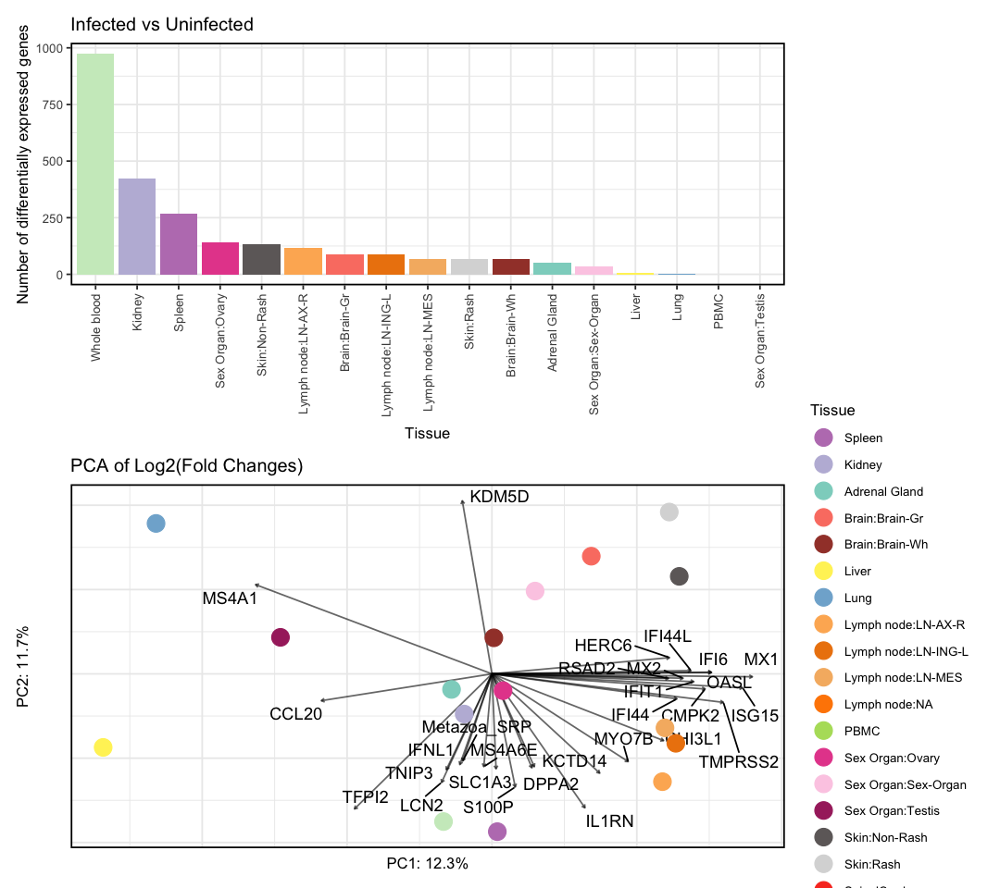

In [27]:
options(repr.plot.width = 9, repr.plot.height = 8)

barp/pca+ plot_layout(heights = c(2,3))
#ggsave("../Barplot_PCA.pdf",width=9,height=8)


In [28]:
tmp2 <- tmp2[tmp2$Gene != "",]

# Convert ens ids to gene names, if they can be converted. Keep as is otherwise
new.names <- sapply(tmp2$Gene, function(x) { 
    new.name <- gene_map[match(x, gene_map$Geneid),'external_gene_name']
    ifelse(new.name == "", x,new.name)
})
new.names
tmp2$Gene<-NULL
tmp2<-as.matrix(tmp2)
rownames(tmp2) <- make.names(new.names,unique = T)


new.names <- sapply(sign$Gene, function(x) { 
    new.name <- gene_map[match(x, gene_map$Geneid),'external_gene_name']
    ifelse(new.name == "", x,new.name)
})
sign$Gene<-NULL
sign<-as.matrix(sign)
rownames(sign) <- make.names(new.names,unique = T)
sign[is.na(sign)] <-1
sign<-ifelse(sign >0.05,0,1)
head(sign)

ENSMMUG00000000265.4   ENSMMUG00000000521.4   ENSMMUG00000002191.4 
             "ADAMTS9"                 "NTN4"                 "OLR1" 
  ENSMMUG00000002217.4   ENSMMUG00000002467.4   ENSMMUG00000002955.4 
                "ALPL"                "CCL23"               "CLEC1B" 
  ENSMMUG00000003061.4   ENSMMUG00000003272.4   ENSMMUG00000003273.4 
              "CCDC80" "ENSMMUG00000003272.4"                 "BCAM" 
  ENSMMUG00000003405.4   ENSMMUG00000003674.4   ENSMMUG00000003953.4 
                "MMP7"                "TREM1" "ENSMMUG00000003953.4" 
  ENSMMUG00000004084.4   ENSMMUG00000004177.4   ENSMMUG00000004224.4 
                "GCH1"                "MYO7B"               "PARP12" 
  ENSMMUG00000004239.4   ENSMMUG00000004954.4   ENSMMUG00000004974.4 
                "FBN1"                "AIFM1"               "TRIM21" 
  ENSMMUG00000005631.4   ENSMMUG00000006070.4   ENSMMUG00000006441.4 
                "CCN3"                "HELZ2"                 "OASL" 
  ENSMMUG00000006550.4   ENSMMUG00000007209.3   ENSMMUG00000007669.4 
             "ZC3HAV1"                "GPER1"                "ISG20" 
  ENSMMUG00000008505.4   ENSMMUG00000008693.4   ENSMMUG00000008711.4 
                "OAS2"                   "C3"               "CHI3L1" 
  ENSMMUG00000008791.4   ENSMMUG00000009454.4   ENSMMUG00000009659.4 
                "CD47"                 "CES1"                 "CILP" 
  ENSMMUG00000009784.4   ENSMMUG00000009810.4   ENSMMUG00000009926.4 
                "CCL8"             "ANKRD30A"             "SERPINE1" 
  ENSMMUG00000010316.4   ENSMMUG00000010384.4   ENSMMUG00000010436.3 
               "HERC5"                "ARMC3"             "TMEM106A" 
  ENSMMUG00000010601.4   ENSMMUG00000010682.4   ENSMMUG00000010866.4 
             "SLC43A3"                 "FBN2"                "IFNL1" 
  ENSMMUG00000010927.4   ENSMMUG00000011146.4   ENSMMUG00000011454.4 
             "TNFAIP6"              "TP53BP2"                 "IFI6" 
  ENSMMUG00000012137.4   ENSMMUG00000012141.4   ENSMMUG00000012432.4 
              "LINGO4"              "CYP26B1"               "LRRC17" 
  ENSMMUG00000012667.4   ENSMMUG00000012782.4   ENSMMUG00000013014.4 
               "ANXA1"                 "OAS1"                "IL1RN" 
  ENSMMUG00000013193.4   ENSMMUG00000013303.4   ENSMMUG00000013841.4 
               "MMP16"              "ALDH1A1"                "PARP8" 
  ENSMMUG00000014293.4   ENSMMUG00000014474.4   ENSMMUG00000014984.4 
             "PLA2G4C"                "SMOC2"                 "KRT4" 
  ENSMMUG00000015329.4   ENSMMUG00000015332.4   ENSMMUG00000015968.4 
                 "MX1"              "TMPRSS2"                "CMPK2" 
  ENSMMUG00000015969.3   ENSMMUG00000016548.4   ENSMMUG00000016880.4 
               "RSAD2"               "CASP12"              "SLC39A8" 
  ENSMMUG00000016997.4   ENSMMUG00000017471.4   ENSMMUG00000017533.4 
                 "DCN"               "KCTD14"                "IFIT1" 
  ENSMMUG00000018273.3   ENSMMUG00000018925.4   ENSMMUG00000018932.4 
              "PARP11"                 "TGM2"               "ADGRE2" 
  ENSMMUG00000019304.4   ENSMMUG00000019591.4   ENSMMUG00000020177.4 
                "IDO1"                "KCNH7"               "MS4A4A" 
  ENSMMUG00000020547.4   ENSMMUG00000020581.4   ENSMMUG00000020903.3 
              "PARP15"                "TFPI2"               "CXCL10" 
  ENSMMUG00000021290.4   ENSMMUG00000021755.4   ENSMMUG00000022229.4 
              "COL5A2"               "PLSCR1"                "MMP28" 
  ENSMMUG00000023312.4   ENSMMUG00000023780.4   ENSMMUG00000038067.2 
                  "HP"                "IFI27" "ENSMMUG00000038067.2" 
  ENSMMUG00000038138.2   ENSMMUG00000041361.2   ENSMMUG00000042320.2 
                 "MDK"          "Metazoa_SRP"               "CMKLR1" 
  ENSMMUG00000042946.2   ENSMMUG00000043809.2   ENSMMUG00000044257.2 
                "CD36"                "CASP2"                  "MX2" 
  ENSMMUG00000044861.2   ENSMMUG00000045017.2   ENSMMUG00000047114.2 
"ENSMMUG0000

,Adrenal Gland,Brain:Brain-Gr,Brain:Brain-Wh,Kidney,Liver,Lung,Lymph node:LN-AX-R,Lymph node:LN-ING-L,Lymph node:LN-MES,Sex Organ:Ovary,Sex Organ:Sex-Organ,Sex Organ:Testis,Skin:Non-Rash,Skin:Rash,Spleen,Whole blood
ADAMTS9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
NTN4,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,1
OLR1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
ALPL,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
CCL23,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
CLEC1B,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [31]:
sign[rownames(sign) =="CILP",]

Adrenal Gland      Brain:Brain-Gr      Brain:Brain-Wh              Kidney 
                  0                   1                   0                   0 
              Liver                Lung  Lymph node:LN-AX-R Lymph node:LN-ING-L 
                  0                   0                   0                   0 
  Lymph node:LN-MES     Sex Organ:Ovary Sex Organ:Sex-Organ    Sex Organ:Testis 
                  0                   0                   0                   0 
      Skin:Non-Rash           Skin:Rash              Spleen         Whole blood 
                  0                   0                   0                   0

In [32]:
library(ComplexHeatmap)



,GeneClass
,<chr>
ADAMTS9,extracellular
NTN4,extracellular
OLR1,inflammation
ALPL,extracellular
CCL23,cytokine
CLEC1B,Other


ERROR: Error in ph1$tree_row: $ operator not defined for this S4 class


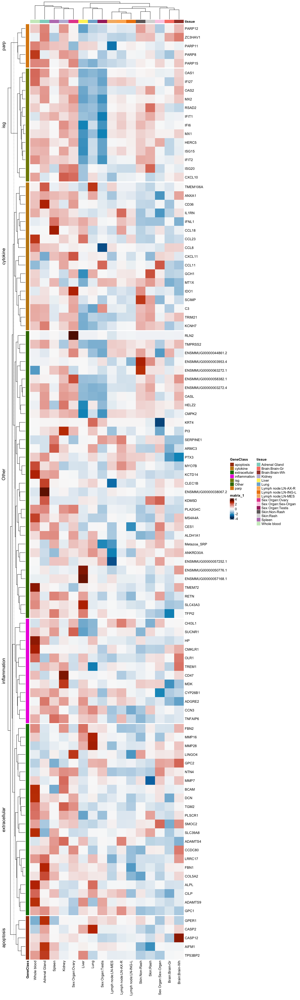

In [33]:
colanno<-data.frame(tissue=colnames(tmp2),row.names = colnames(tmp2))
color<-list(tissue=color_ft)
tmp3<-as.matrix(tmp2)
tmp3[is.na(tmp3)] <- 0

new.names <- sapply(rownames(tmp3), function(x) { 
    new.name <- types.genes[match(x, types.genes$Gene),'type']
    ifelse(is.na(new.name),"Other",new.name)
})
annotation_row = data.frame(
    GeneClass = new.names
)
rownames(annotation_row) = rownames(tmp3)
head(annotation_row)

#pheatmap(tmp3,show_rownames = TRUE, scale="row",  color = colorRampPalette(c("navy","white", "firebrick3"))(100), fontsize_row=6)
ph1<-pheatmap(tmp3,show_rownames = TRUE, scale="row",  
         color = hcl.colors(100, palette = "RdBu",rev = T), fontsize_row=10,cluster_cols=T,
                       annotation_colors=color,annotation_col=colanno,
                        row_split = annotation_row$GeneClass, annotation_row = annotation_row)
options(repr.plot.width=12,repr.plot.height=40)
ph1
pheatmap(sign,show_rownames = TRUE,  color = c("white", "black"),
         breaks = c(0, 1) , fontsize_row=10,cluster_rows = ph1$tree_row,cluster_cols=ph1$tree_col,
         legend = FALSE,annotation_colors=color,annotation_col=colanno)

m3 = make_comb_mat(t(sign[1:31,]))
t(m3)
UpSet((m3),lwd=0.3,pt_size = unit(5, "mm"),top_annotation = NULL)





Adrenal Gland      Brain:Brain-Gr      Brain:Brain-Wh              Kidney 
        -2.00325247          0.50238020          1.29993085          0.56208237 
              Liver                Lung  Lymph node:LN-AX-R Lymph node:LN-ING-L 
         1.16710489          3.85967308          0.06331495         -0.07063134 
  Lymph node:LN-MES     Sex Organ:Ovary Sex Organ:Sex-Organ    Sex Organ:Testis 
         0.72217959          0.00000000        -18.55193277          0.11455393 
      Skin:Non-Rash           Skin:Rash              Spleen         Whole blood 
         0.66918090         20.38236897          0.17261467          0.40165321

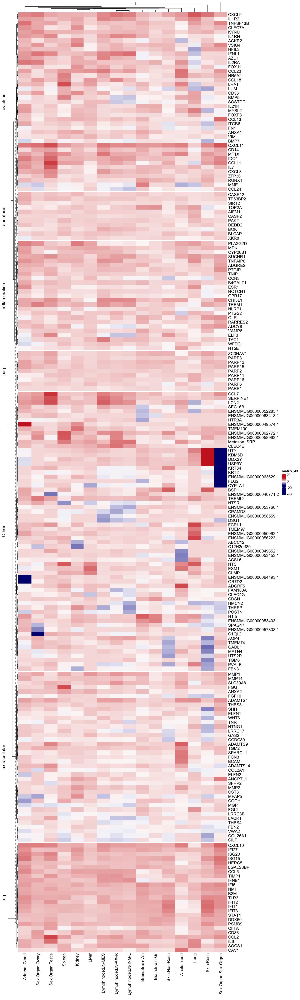

In [262]:
options(repr.plot.width=12,repr.plot.height=40)

tmp3[rownames(tmp3) =="UTY",]
Heatmap((((tmp3))),col=colorRampPalette(c("navy","navy","white", "firebrick3","firebrick3"))(50),
                        row_split = annotation_row$GeneClass, clustering_distance_rows = "pearson")

Warning message:
“You defined `cell_fun` for a heatmap with more than 100 rows or
columns, which might be very slow to draw. Consider to use the
vectorized version `layer_fun`.”


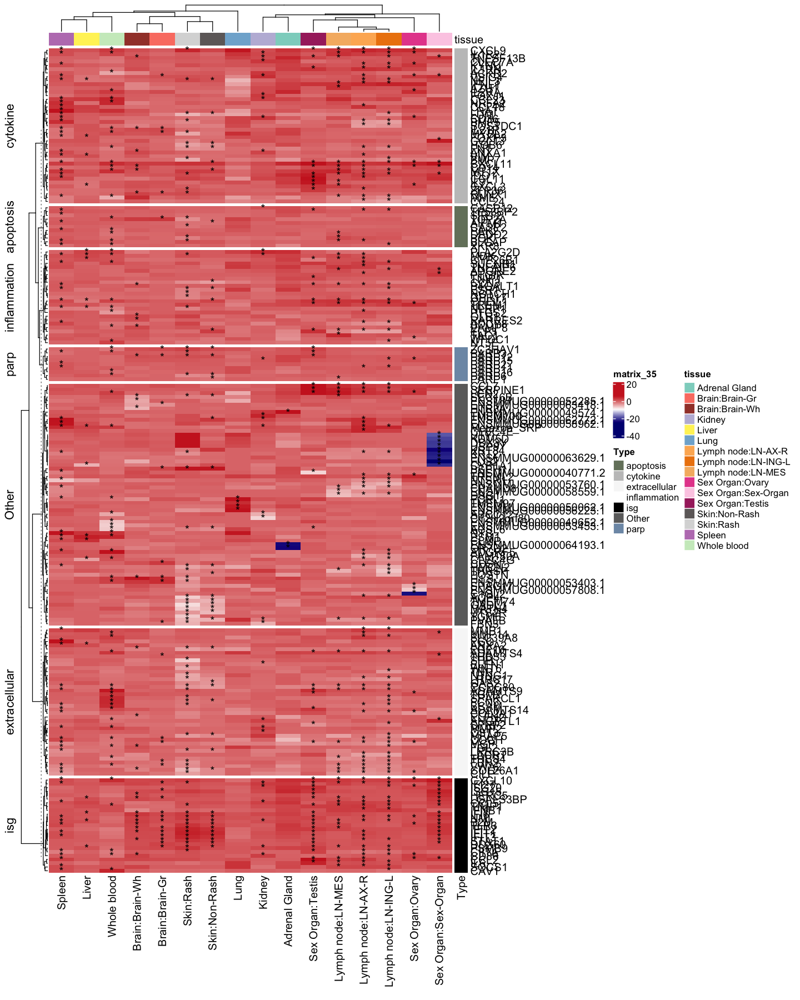

pdf 
  2

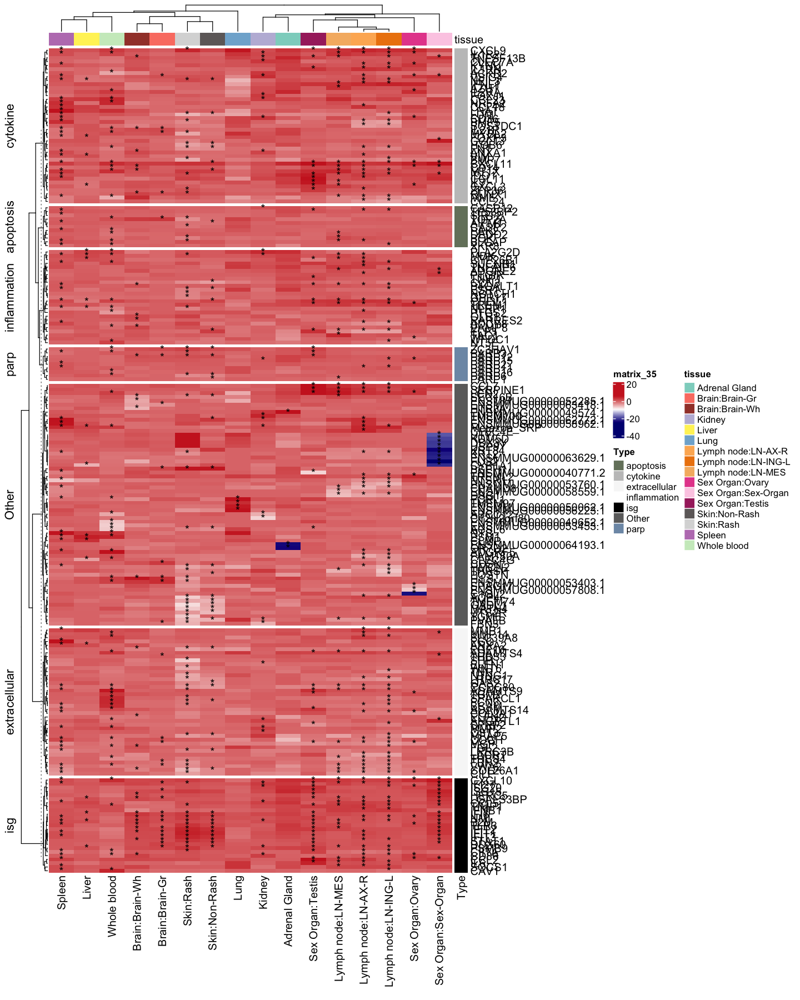

In [254]:
col_annot=c("#f7f7f7","black","#6c6c6c","#c3c3c3","white","#7e99b4","#75816b")
names(col_annot)=unique(annotation_row$GeneClass)

ha = HeatmapAnnotation( 
    df = colanno,col=color
)
options(repr.plot.width=12,repr.plot.height=15)

ht=Heatmap((((tmp3))),col=colorRampPalette(c("navy", "white", "firebrick3","firebrick3"))(50),
                        row_split = annotation_row$GeneClass, clustering_distance_rows = "pearson",
        clustering_distance_columns = "pearson",
              cell_fun = function(j, i, x, y, w, h, fill) {
    if(sign[i, j] == 1) {grid.text("*", x, y)} },top_annotation=ha,
        right_annotation = rowAnnotation(Type=annotation_row$GeneClass,
                                         col=list(Type=col_annot))
       )
ht
draw(ht)
library(GetoptLong)
library(ComplexHeatmap)

pdf(qq("../heatmap_FC_5VsLate.pdf"), width = 13, height = 18)
draw(ht)
dev.off()



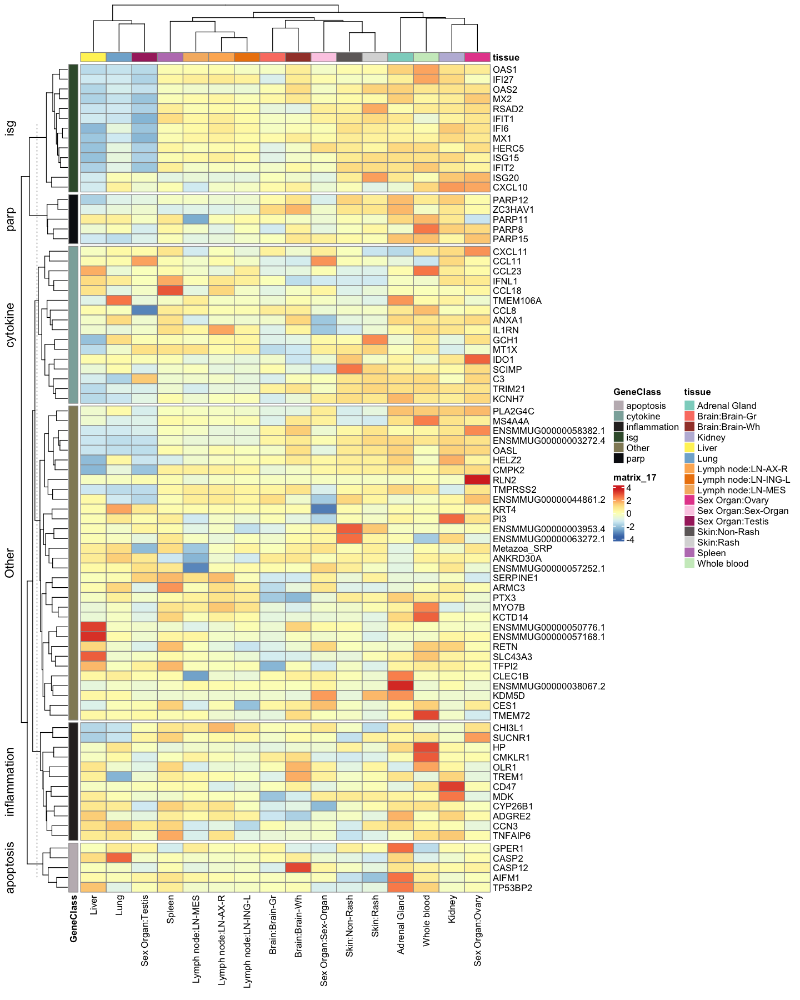

In [179]:
ShalekCS<-colorRampPalette(c("#A020F0", "#9C1FEB", "#991EE6", "#961EE1", "#931DDC", "#8F1CD7", "#8C1CD2", "#891BCE",
                   "#861AC9", "#821AC4", "#7F19BF", "#7C18BA", "#7918B5", "#7517B0", "#7216AC", "#6F16A7",
                   "#6C15A2", "#69159D", "#651498", "#621393", "#5F138F", "#5C128A", "#581185", "#551180",
                   "#52107B", "#4F0F76", "#4B0F71", "#480E6D", "#450D68", "#420D63", "#3F0C5E", "#3B0B59",
                   "#380B54", "#350A4F", "#320A4B", "#2E0946", "#2B0841", "#28083C", "#250737", "#210632",
                   "#1E062E", "#1B0529", "#180424", "#15041F", "#11031A", "#0E0215", "#0B0210", "#08010C",
                   "#040007", "#010002", "#020200", "#070700", "#0C0C00", "#121200", "#171700", "#1C1C00",
                   "#212100", "#262600", "#2B2B00", "#303000", "#363600", "#3B3B00", "#404000", "#454500",
                   "#4A4A00", "#4F4F00", "#555500", "#5A5A00", "#5F5F00","#646400", "#696900", "#6E6E00",
                   "#737300", "#797900", "#7E7E00", "#838300", "#888800", "#8D8D00", "#929200", "#979700",
                   "#9D9D00", "#A2A200", "#A7A700", "#ACAC00", "#B1B100", "#B6B600", "#BCBC00", "#C1C100",
                   "#C6C600", "#CBCB00", "#D0D000", "#D5D500", "#DADA00", "#E0E000", "#E5E500", "#EAEA00",
                   "#EFEF00", "#F4F400", "#F9F900", "#FFFF00"))(1)


material.heat = function(n){
    colorRampPalette(
        rev(c("#D73027", "#FC8D59", "#FEE090", "#FFFFBF", "#E0F3F8", "#91BFDB", "#4575B4")))(n)
}

pheatmap(tmp3,show_rownames = TRUE, scale="row",  
         color = material.heat(20), fontsize_row=10,cluster_cols=T,
                       annotation_colors=color,annotation_col=colanno,
                        row_split = annotation_row$GeneClass, annotation_row = annotation_row)



In [180]:
table(de.genes.Impulse$tissue)


      Adrenal Gland      Brain:Brain-Gr      Brain:Brain-Wh              Kidney 
              35395               35395               35395               35395 
              Liver                Lung  Lymph node:LN-AX-R Lymph node:LN-ING-L 
              35395               35395               35395               35395 
  Lymph node:LN-MES                PBMC     Sex Organ:Ovary Sex Organ:Sex-Organ 
              35395               35395               35395               35395 
   Sex Organ:Testis       Skin:Non-Rash           Skin:Rash              Spleen 
              35395               35395               35395               35395 
        Whole blood 
              35395 

[1] Spleen              Lymph node:LN-AX-R  Lymph node:LN-ING-L
[4] Lymph node:LN-MES  
19 Levels: Adrenal Gland Brain:Brain-Gr Brain:Brain-Wh Kidney Liver ... Whole blood

Spleen  Lymph node:LN-AX-R Lymph node:LN-ING-L   Lymph node:LN-MES 
          "#BC80BD"           "#FDB462"           "#ed830c"           "#f5b771"

6         4         7         3         8         5         0 
"#EFF3FF" "#C6DBEF" "#9ECAE1" "#6BAED6" "#4292C6" "#2171B5" "#084594"

[1] "6" "4" "7" "3" "8" "5" "0"

[1] "A0246_S135_L002" "A0260_S132_L002" "A0274_S129_L002" "A0247_S134_L002"
[5] "A0261_S131_L002" "A0275_S128_L002"

,A0246_S135_L002,A0260_S132_L002,A0274_S129_L002,A0247_S134_L002,A0261_S131_L002,A0275_S128_L002,A0248_S133_L002,A0262_S130_L002,A0276_S127_L002,A0239_S23_L001,⋯,A0043_S118_L002,A0141_S111_L002,A0078_S173_L002,A0204_S146_L002,A0079_S172_L002,A0205_S145_L002,A0080_S171_L002,A0206_S144_L002,A0071_S116_L002,A0197_S107_L002
PARP14,2.598918,2.731281,2.636616,2.658200,2.489467,2.720694,2.203129,2.715314,2.555750,2.471774,⋯,3.096693,3.113859,3.078255,3.273493,2.949785,3.226679,3.046967,3.116193,3.208326,3.113426
PARP9,1.928412,2.072579,1.842760,1.956250,1.694259,2.063077,2.028396,2.081271,1.885201,1.797217,⋯,2.777409,2.579722,2.399786,2.374797,2.322266,2.434684,2.410033,2.373251,2.616201,2.701168
HERC6,2.311036,2.315389,2.087360,2.244944,2.078995,2.316677,1.559336,2.298464,2.183393,2.154406,⋯,2.840331,2.978650,2.798122,2.749236,2.720581,2.863446,2.828279,2.541484,3.037839,2.707404
HERC5,1.696556,1.811086,1.405860,1.678889,1.414380,1.709033,1.559336,1.879659,1.206810,1.402761,⋯,2.809457,2.915136,2.370117,2.438747,2.155687,2.749592,2.513667,2.416075,2.893381,2.786443
DDX60,1.982314,2.008332,1.638144,1.964309,1.737195,2.077799,2.152317,2.123463,1.570993,1.750696,⋯,2.721721,2.821955,2.334121,2.571711,2.086772,2.741435,2.563162,2.699058,2.767544,2.897434
MX1,1.973407,2.095535,2.018184,2.107253,2.045861,2.322209,0.000000,2.420428,1.819970,2.185940,⋯,3.532999,3.616527,3.368254,3.427572,3.306593,3.340837,3.261504,3.374139,3.465594,3.457101


[1] "6" "4" "7" "3" "8" "5" "0"

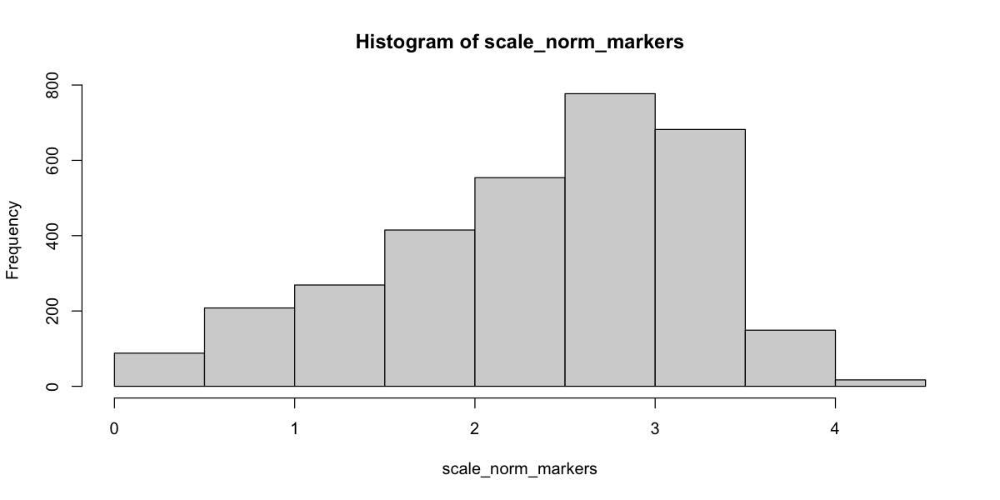

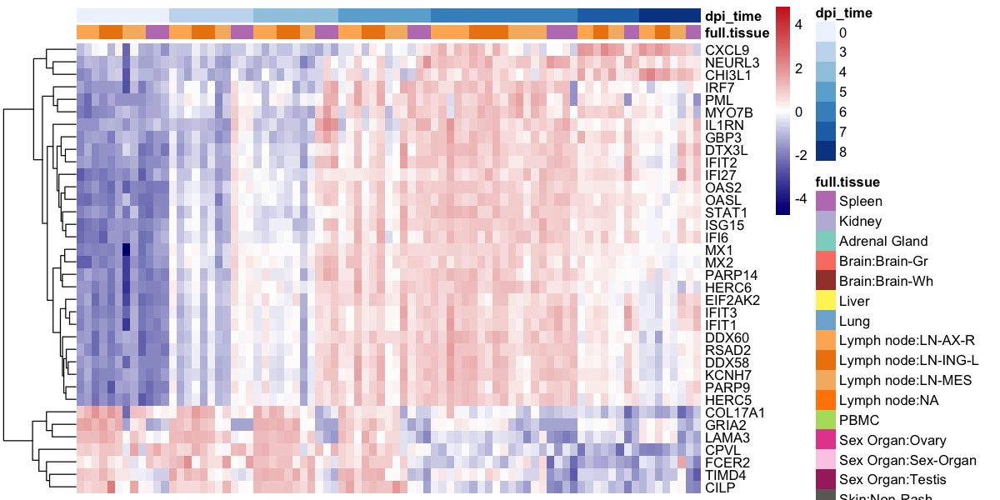

In [36]:
time.markers<-de.genes.Impulse %>% filter(tissue %in% c("Lymph node:LN-AX-R", "Lymph node:LN-ING-L","Lymph node:LN-MES","Spleen"))
time.markers <- time.markers %>% group_by(tissue) %>% top_n(12, -padj)
time.markers2<-unique(time.markers$Gene)
dds.qc.experimental<-dds.qc.experimental.alltp
dds.qc.experimental<-dds.qc.experimental[,dds.qc.experimental$full.tissue %in% c("Lymph node:LN-AX-R", "Lymph node:LN-ING-L","Lymph node:LN-MES","Spleen")] 

norm_counts <- counts(dds.qc.experimental, normalized=TRUE)
norm_counts <- log10(norm_counts[time.markers2,]+1)
scale_norm_markers <- norm_counts
#scale_norm_markers <- scale(norm_counts[time.markers2,],center = T,scale=T)

hist(scale_norm_markers)

#threshold <- 5
#scale_norm_markers[scale_norm_markers>threshold] <- threshold
#scale_norm_markers[scale_norm_markers< (-1*threshold)] <- -1*threshold
rownames(scale_norm_markers) <- rowData(dds.qc.experimental.alltp)[rownames(scale_norm_markers),]$external_gene_name
#scale_norm_markers <- scale_norm_markers[rownames(scale_norm_markers) != '',]
scale_norm_markers<-scale_norm_markers[rownames(scale_norm_markers)[!is.na(rownames(scale_norm_markers)) & rownames(scale_norm_markers) != "" ],]

unique(dds.qc.experimental$full.tissue)
color_ft[unique(time.markers$tissue)]
dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=as.character(unique(dds.qc.experimental$dpi_time_factor))
dpi_time
unique(as.data.frame(colData(dds.qc.experimental))[,c('full.tissue','dpi_time_factor'),drop=FALSE]$dpi_time_factor)
col.order<-rownames(as.data.frame(colData(dds.qc.experimental))[c('full.tissue','dpi_time_factor')] %>% 
                dplyr::arrange(dpi_time_factor,full.tissue))
head(col.order)
head(scale_norm_markers[,col.order])
as.character(unique(dds.qc.experimental$dpi_time))

dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=sort(as.character(unique(dds.qc.experimental$dpi_time)))

mat_colors <- list(full.tissue=color_ft,dpi_time=dpi_time)

options(repr.plot.width=10,repr.plot.height=5)

library(pheatmap)

pheatmap(scale_norm_markers[,col.order],
         clustering_distance_rows='euclidean',scale="row",
         color=colorRampPalette(c("navy", "white","firebrick3"))(100),
         border_color=NA,annotation_col=as.data.frame(colData(dds.qc.experimental[,dds.qc.experimental$dpi_time_factor != '<0']))[,c('full.tissue','dpi_time'),drop=FALSE],
         annotation_colors=mat_colors,
         show_colnames=FALSE,cluster_cols = FALSE,cluster_rows=TRUE,
         filename="../heatmapLN.pdf",width=8,height=6)

pheatmap(scale_norm_markers[,col.order],
         clustering_distance_rows='euclidean',scale="row",
         color=colorRampPalette(c("navy", "white","firebrick3"))(100),
         border_color=NA,annotation_col=as.data.frame(colData(dds.qc.experimental[,dds.qc.experimental$dpi_time_factor != '<0']))[,c('full.tissue','dpi_time'),drop=FALSE],
         annotation_colors=mat_colors,
         show_colnames=FALSE,cluster_cols = FALSE,cluster_rows=TRUE)


[1] Brain:Brain-Gr Brain:Brain-Wh
19 Levels: Adrenal Gland Brain:Brain-Gr Brain:Brain-Wh Kidney Liver ... Whole blood

Brain:Brain-Gr Brain:Brain-Wh 
     "#FB8072"      "#a34136"

6         4         7         3         8         5         0 
"#EFF3FF" "#C6DBEF" "#9ECAE1" "#6BAED6" "#4292C6" "#2171B5" "#084594"

[1] "6" "4" "7" "3" "8" "5" "0"

[1] "A0244_S73_L002"  "A0258_S72_L002"  "A0272_S71_L002"  "A0243_S106_L002"
[5] "A0062_S84_L002"  "A0090_S82_L002"

,A0244_S73_L002,A0258_S72_L002,A0272_S71_L002,A0243_S106_L002,A0062_S84_L002,A0090_S82_L002,A0104_S29_L001,A0103,A0020_S88_L002,A0034_S87_L002,⋯,A0188_S77_L002,A0230_S74_L002,A0286_S70_L002,A0229_S107_L002,A0048_S86_L002,A0146_S80_L002,A0145,A0076_S83_L002,A0202_S76_L002,A0201_S109_L002
IFI6,1.4497965,1.7585483,1.8273969,2.1752598,2.175496,2.1828283,2.263123,2.598061,2.637552,2.381370,⋯,2.953178,3.268156,3.147845,3.770993,2.955975,3.204058,3.884215,3.022056,3.394680,4.111760
HERC6,1.3371692,1.4339844,1.5258153,1.3271354,1.975876,2.0142259,1.950565,2.125811,2.420228,2.064045,⋯,2.631286,2.621161,2.657448,2.695434,2.563833,2.620373,2.657523,2.644462,2.534613,2.709477
DDX60,0.7234638,0.6553304,0.9859888,0.7323774,1.230434,1.5489615,1.454539,1.610744,1.636135,1.550426,⋯,2.535700,2.199330,2.116373,2.315877,1.962672,2.199778,2.396910,2.292728,2.252319,2.325627
TMPRSS2,0.7234638,0.7804200,0.7696669,0.5610868,1.305336,0.9822327,1.485966,1.852977,1.789869,1.730463,⋯,1.932086,2.329664,2.211763,2.404993,2.119069,2.008475,2.061053,1.969423,2.130084,2.139929
MX1,1.9456262,2.0943661,2.0197296,1.9135821,2.836688,2.5670776,2.921774,3.187304,3.248574,3.072054,⋯,3.648804,3.892957,3.769751,4.100639,3.596759,3.757643,4.007375,3.453053,3.792103,3.942162
ZC3HAV1,1.4271710,1.3248112,1.6975713,1.4776805,1.595481,1.6434107,1.922959,2.135519,1.990252,1.996181,⋯,2.300227,2.589616,2.424222,2.649245,2.280879,2.432717,2.499470,2.307940,2.517392,2.591418


[1] "6" "4" "7" "3" "8" "5" "0"

0         3         4         5         6         7         8 
"#EFF3FF" "#C6DBEF" "#9ECAE1" "#6BAED6" "#4292C6" "#2171B5" "#084594"

$full.tissue
             Spleen              Kidney       Adrenal Gland      Brain:Brain-Gr 
          "#BC80BD"           "#BEBADA"           "#8DD3C7"           "#FB8072" 
     Brain:Brain-Wh               Liver                Lung  Lymph node:LN-AX-R 
          "#a34136"           "#fff265"           "#80B1D3"           "#FDB462" 
Lymph node:LN-ING-L   Lymph node:LN-MES       Lymph node:NA                PBMC 
          "#ed830c"           "#f5b771"           "#ff8700"           "#B3DE69" 
    Sex Organ:Ovary Sex Organ:Sex-Organ    Sex Organ:Testis       Skin:Non-Rash 
          "#e64e9b"           "#FCCDE5"           "#a82d6c"           "#6e6969" 
          Skin:Rash          SpinalCord         Whole blood 
          "#D9D9D9"           "#f93d28"           "#CCEBC5" 

$dpi_time
        0         3         4         5         6         7         8 
"#EFF3FF" "#C6DBEF" "#9ECAE1" "#6BAED6" "#4292C6" "#2171B5" "#084594"

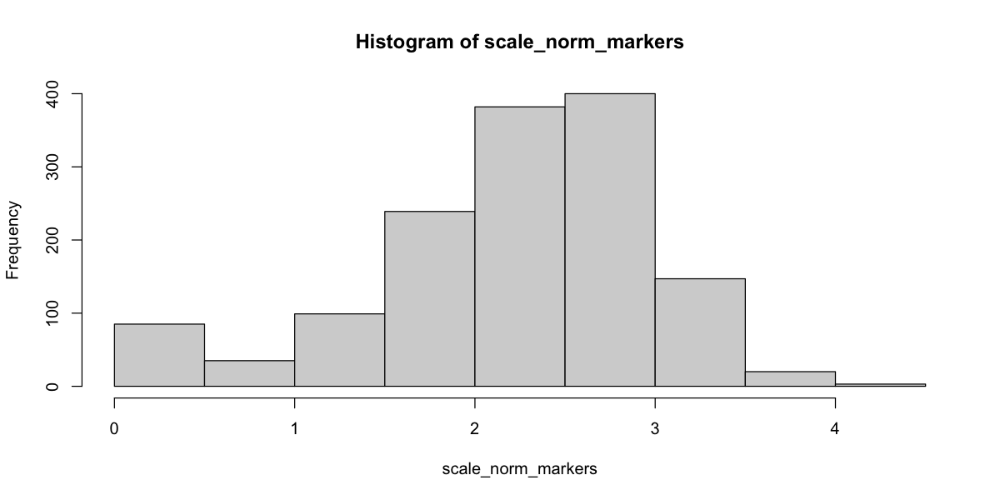

In [194]:
time.markers<-de.genes.Impulse %>% filter(tissue %in% c("Brain:Brain-Gr","Brain:Brain-Wh"))
time.markers <- time.markers %>% group_by(tissue) %>% top_n(27, -padj)
time.markers2<-unique(time.markers$Gene)
dds.qc.experimental<-dds.qc.experimental.alltp
dds.qc.experimental<-dds.qc.experimental[,dds.qc.experimental$full.tissue %in% c("Brain:Brain-Gr","Brain:Brain-Wh")] 

norm_counts <- counts(dds.qc.experimental, normalized=TRUE)
norm_counts <- log10(norm_counts[time.markers2,]+1)
scale_norm_markers <- norm_counts
#scale_norm_markers <- scale(norm_counts[time.markers2,],center = T,scale=T)

hist(scale_norm_markers)

#threshold <- 5
#scale_norm_markers[scale_norm_markers>threshold] <- threshold
#scale_norm_markers[scale_norm_markers< (-1*threshold)] <- -1*threshold
rownames(scale_norm_markers) <- rowData(dds.qc.experimental.alltp)[rownames(scale_norm_markers),]$external_gene_name
#scale_norm_markers <- scale_norm_markers[rownames(scale_norm_markers) != '',]
scale_norm_markers<-scale_norm_markers[rownames(scale_norm_markers)[!is.na(rownames(scale_norm_markers)) & rownames(scale_norm_markers) != "" ],]

unique(dds.qc.experimental$full.tissue)
color_ft[unique(time.markers$tissue)]
dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=as.character(unique(dds.qc.experimental$dpi_time_factor))
dpi_time
unique(as.data.frame(colData(dds.qc.experimental))[,c('full.tissue','dpi_time_factor'),drop=FALSE]$dpi_time_factor)
col.order<-rownames(as.data.frame(colData(dds.qc.experimental))[c('full.tissue','dpi_time_factor')] %>% 
                dplyr::arrange(dpi_time_factor,full.tissue))
head(col.order)
head(scale_norm_markers[,col.order])
as.character(unique(dds.qc.experimental$dpi_time))

dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=sort(as.character(unique(dds.qc.experimental$dpi_time)))
dpi_time
mat_colors <- list(full.tissue=color_ft,dpi_time=dpi_time)
mat_colors

options(repr.plot.width=10,repr.plot.height=5)

library(pheatmap)

pheatmap(scale_norm_markers[,col.order],
         clustering_distance_rows='euclidean',scale="row",
         color=colorRampPalette(c("navy", "white","firebrick3"))(100),
         border_color=NA,annotation_col=as.data.frame(colData(dds.qc.experimental[,dds.qc.experimental$dpi_time_factor != '<0']))[,c('full.tissue','dpi_time'),drop=FALSE],
         annotation_colors=mat_colors,
         show_colnames=FALSE,cluster_cols = FALSE,cluster_rows=TRUE,filename="../heatmapBrain.pdf",width=8,height=6)


[1] "ENSMMUG00000004347.4" "ENSMMUG00000017022.4" "ENSMMUG00000064170.1"
  [4] "ENSMMUG00000064170.1" "ENSMMUG00000004347.4" "ENSMMUG00000017022.4"
  [7] "ENSMMUG00000021286.4" "ENSMMUG00000001467.4" "ENSMMUG00000003548.4"
 [10] "ENSMMUG00000016046.3" "ENSMMUG00000039654.2" "ENSMMUG00000011362.4"
 [13] "ENSMMUG00000021641.4" "ENSMMUG00000054963.1" "ENSMMUG00000011444.4"
 [16] "ENSMMUG00000010682.4" "ENSMMUG00000016997.4" "ENSMMUG00000008256.4"
 [19] "ENSMMUG00000004103.4" "ENSMMUG00000021290.4" "ENSMMUG00000004239.4"
 [22] "ENSMMUG00000015084.4" "ENSMMUG00000003637.4" "ENSMMUG00000016200.4"
 [25] "ENSMMUG00000022282.4" "ENSMMUG00000050596.1" "ENSMMUG00000008387.4"
 [28] "ENSMMUG00000007499.4" "ENSMMUG00000004282.4" "ENSMMUG00000050596.1"
 [31] "ENSMMUG00000008387.4" NA                     NA                    
 [34] "ENSMMUG00000050596.1" "ENSMMUG00000008387.4" "ENSMMUG00000007953.4"
 [37] "ENSMMUG00000007499.4" "ENSMMUG00000004253.4" "ENSMMUG00000004844.4"
 [40] "ENSMMUG00000005243.4" "ENSMMUG00000015084.4" "ENSMMUG00000003301.4"
 [43] "ENSMMUG00000004282.4" NA                     "ENSMMUG00000016997.4"
 [46] "ENSMMUG00000008256.4" "ENSMMUG00000016046.3" NA                    
 [49] "ENSMMUG00000021286.4" "ENSMMUG00000001467.4" "ENSMMUG00000001066.4"
 [52] "ENSMMUG00000050596.1" "ENSMMUG00000008387.4" "ENSMMUG00000022613.4"
 [55] "ENSMMUG00000007953.4" "ENSMMUG00000008197.4" "ENSMMUG00000013193.4"
 [58] "ENSMMUG00000007675.4" "ENSMMUG00000050712.1" "ENSMMUG00000007499.4"
 [61] "ENSMMUG00000008447.4" "ENSMMUG00000011669.4" "ENSMMUG00000016046.3"
 [64] "ENSMMUG00000000265.4" "ENSMMUG00000009097.4" "ENSMMUG00000004347.4"
 [67] "ENSMMUG00000015851.4" "ENSMMUG00000056626.1" "ENSMMUG00000002932.4"
 [70] "ENSMMUG00000039654.2" "ENSMMUG00000009483.4" "ENSMMUG00000020818.4"
 [73] "ENSMMUG00000008635.4" "ENSMMUG00000010660.4" "ENSMMUG00000021642.4"
 [76] "ENSMMUG00000003405.4" "ENSMMUG00000045043.2" "ENSMMUG00000019496.4"
 [79] "ENSMMUG00000064987.1" "ENSMMUG00000002037.4" "ENSMMUG00000004249.4"
 [82] "ENSMMUG00000004250.4" "ENSMMUG00000004253.4" "ENSMMUG00000000785.4"
 [85] "ENSMMUG00000010922.4" "ENSMMUG00000011444.4" "ENSMMUG00000007891.4"
 [88] "ENSMMUG00000000130.4" "ENSMMUG00000023274.4" "ENSMMUG00000009010.4"
 [91] "ENSMMUG00000004683.4" "ENSMMUG00000003638.4" "ENSMMUG00000004844.4"
 [94] "ENSMMUG00000004071.4" "ENSMMUG00000013054.4" "ENSMMUG00000002952.4"
 [97] "ENSMMUG00000001929.4" "ENSMMUG00000003061.4" "ENSMMUG00000002122.4"
[100] "ENSMMUG00000058999.1" "ENSMMUG00000000694.4" "ENSMMUG00000016995.4"
[103] "ENSMMUG00000002138.4" "ENSMMUG00000017022.4" "ENSMMUG00000016880.4"
[106] "ENSMMUG00000012330.4" "ENSMMUG00000015455.4" "ENSMMUG00000017668.4"
[109] "ENSMMUG00000019415.4" "ENSMMUG00000013665.4" "ENSMMUG00000000332.4"
[112] "ENSMMUG00000004103.4" "ENSMMUG00000021290.4" "ENSMMUG00000055187.1"
[115] "ENSMMUG00000005243.4" "ENSMMUG00000002424.4" "ENSMMUG00000006187.4"
[118] "ENSMMUG00000002158.4" "ENSMMUG00000013197.4" "ENSMMUG00000015084.4"
[121] "ENSMMUG00000045654.2" "ENSMMUG00000014419.4" "ENSMMUG00000003301.4"
[124] "ENSMMUG00000002672.4" "ENSMMUG00000017196.4" "ENSMMUG00000056387.1"
[127] "ENSMMUG00000064170.1" "ENSMMUG00000050419.1" "ENSMMUG00000019012.4"
[130] "ENSMMUG00000014474.4" "ENSMMUG00000057952.1" "ENSMMUG00000016200.4"
[133] "ENSMMUG00000014384.4" "ENSMMUG00000004282.4" "ENSMMUG00000008142.4"
[136] "ENSMMUG00000047247.2" "ENSMMUG00000021286.4" "ENSMMUG00000001467.4"
[139] "ENSMMUG00000001066.4" "ENSMMUG00000022229.4" "ENSMMUG00000003143.4"
[142] "ENSMMUG00000011426.4" "ENSMMUG00000062825.1" "ENSMMUG00000012321.4"
[145] "ENSMMUG00000018445.4" "ENSMMUG00000008197.4" "ENSMMUG00000001475.4"
[148] "ENSMMUG00000055568.1" "ENSMMUG00000013193.4" "ENSMMUG00000012432.4"
[151] "ENSMMUG00000046449.2" "ENSMMUG00000052785.1" "ENSMMUG00000003283.4"
[154] "ENSMMUG00000016046.3" "ENSMMUG00000022521.4" "ENSMMUG00000056083.1"
[157] "ENSMMUG00000000265.4" "ENSMMUG00000021304.4" "ENSMMUG00000004475.4"
[160] "ENSMMUG00000021302.4

In [32]:
table(dds.qc.experimental.alltp$dpi_time_factor)


<0  0  3  4  5  6  7  8 
34 39 38 36 37 56 23 21 

In [29]:
time.markers<-de.genes.Impulse %>% filter(Gene %in% extraecllular.genes) %>%
filter(tissue %in% c("Lymph node:LN-AX-R", "Lymph node:LN-ING-L","Lymph node:LN-MES","Spleen"))

time.markers<-time.markers %>% filter(padj<0.05) 
time.markers <- time.markers %>% group_by(tissue) %>% top_n(10, -padj)
time.markers2<-unique(time.markers$Gene)
dds.qc.experimental<-dds.qc.experimental.alltp
dds.qc.experimental<-dds.qc.experimental[,dds.qc.experimental$full.tissue %in% c("Lymph node:LN-AX-R", "Lymph node:LN-ING-L","Lymph node:LN-MES","Spleen")] 

norm_counts <- counts(dds.qc.experimental, normalized=TRUE)
norm_counts <- log10(norm_counts[time.markers2,]+1)
scale_norm_markers <- norm_counts
rownames(scale_norm_markers) <- rowData(dds.qc.experimental.alltp)[rownames(scale_norm_markers),]$external_gene_name
scale_norm_markers<-scale_norm_markers[rownames(scale_norm_markers)[!is.na(rownames(scale_norm_markers)) & rownames(scale_norm_markers) != "" ],]

unique(dds.qc.experimental$full.tissue)
color_ft[unique(time.markers$tissue)]
dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=as.character(unique(dds.qc.experimental$dpi_time_factor))

unique(as.data.frame(colData(dds.qc.experimental))[,c('full.tissue','dpi_time_factor'),drop=FALSE]$dpi_time_factor)
col.order<-rownames(as.data.frame(colData(dds.qc.experimental))[c('full.tissue','dpi_time_factor')] %>% 
                dplyr::arrange(dpi_time_factor,full.tissue))
as.character(unique(dds.qc.experimental$dpi_time))

dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=sort(as.character(unique(dds.qc.experimental$dpi_time)))

mat_colors <- list(full.tissue=color_ft,dpi_time=dpi_time)

options(repr.plot.width=10,repr.plot.height=6)

library(pheatmap)


pheatmap::pheatmap(scale_norm_markers[,col.order],
         clustering_distance_rows='euclidean',scale="row",
         color=colorRampPalette(c("navy", "white","firebrick3"))(100),
         border_color=NA,annotation_col=as.data.frame(colData(dds.qc.experimental[,dds.qc.experimental$dpi_time_factor != '<0']))[,c('full.tissue','dpi_time'),drop=FALSE],
         annotation_colors=mat_colors,
         show_colnames=FALSE,cluster_cols = FALSE,cluster_rows=TRUE,filename="../heatmapBrain.pdf",width=8,height=6)


[1] Spleen              Lymph node:LN-AX-R  Lymph node:LN-ING-L
[4] Lymph node:LN-MES  
19 Levels: Adrenal Gland Brain:Brain-Gr Brain:Brain-Wh Kidney Liver ... Whole blood

Spleen  Lymph node:LN-AX-R Lymph node:LN-ING-L   Lymph node:LN-MES 
          "#BC80BD"           "#FDB462"           "#ed830c"           "#f5b771"

[1] "6" "4" "7" "3" "8" "5" "0"

[1] "6" "4" "7" "3" "8" "5" "0"

In [25]:
sort(unique(de.genes.Impulse$tissue))

[1] "Adrenal Gland"       "Brain:Brain-Gr"      "Brain:Brain-Wh"     
 [4] "Kidney"              "Liver"               "Lung"               
 [7] "Lymph node:LN-AX-R"  "Lymph node:LN-ING-L" "Lymph node:LN-MES"  
[10] "PBMC"                "Sex Organ:Ovary"     "Sex Organ:Sex-Organ"
[13] "Sex Organ:Testis"    "Skin:Non-Rash"       "Skin:Rash"          
[16] "Spleen"              "Whole blood"

[1] Kidney
19 Levels: Adrenal Gland Brain:Brain-Gr Brain:Brain-Wh Kidney Liver ... Whole blood

Kidney 
"#BEBADA"

[1] "6" "4" "7" "3" "8" "5" "0"

[1] "6" "4" "7" "3" "8" "5" "0"

Warning message:
“Column annotation has different order from matrix columns. Adjust the
column annotation based on column names of the matrix.”


[1] Whole blood
19 Levels: Adrenal Gland Brain:Brain-Gr Brain:Brain-Wh Kidney Liver ... Whole blood

Whole blood 
  "#CCEBC5"

[1] "<0" "0"  "7"  "6"  "8"  "3"  "5"  "4"

[1] "0" "7" "6" "8" "3" "5" "4"

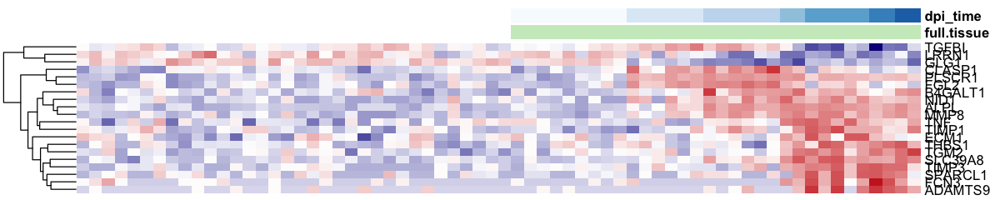

In [33]:
time.markers<-de.genes.Impulse %>% filter(Gene %in% extraecllular.genes) %>%
filter(tissue %in% c("Whole blood"))

time.markers<-time.markers %>% filter(padj<0.05) 
time.markers <- time.markers %>% group_by(tissue) %>% top_n(20, -padj)
time.markers2<-unique(time.markers$Gene)
dds.qc.experimental<-dds.qc.experimental.alltp
dds.qc.experimental<-dds.qc.experimental[,dds.qc.experimental$full.tissue %in% c("Whole blood")] 

norm_counts <- counts(dds.qc.experimental, normalized=TRUE)
norm_counts <- log10(norm_counts[time.markers2,]+1)
scale_norm_markers <- norm_counts
rownames(scale_norm_markers) <- rowData(dds.qc.experimental.alltp)[rownames(scale_norm_markers),]$external_gene_name
scale_norm_markers<-scale_norm_markers[rownames(scale_norm_markers)[!is.na(rownames(scale_norm_markers)) & rownames(scale_norm_markers) != "" ],]

unique(dds.qc.experimental$full.tissue)
color_ft[unique(time.markers$tissue)]
dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=as.character(unique(dds.qc.experimental$dpi_time_factor))

unique(as.data.frame(colData(dds.qc.experimental))[,c('full.tissue','dpi_time_factor'),drop=FALSE]$dpi_time_factor)
col.order<-rownames(as.data.frame(colData(dds.qc.experimental))[c('full.tissue','dpi_time_factor')] %>% 
                dplyr::arrange(dpi_time_factor,full.tissue))
as.character(unique(dds.qc.experimental$dpi_time))

dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=sort(as.character(unique(dds.qc.experimental$dpi_time)))

mat_colors <- list(full.tissue=color_ft,dpi_time=dpi_time)

options(repr.plot.width=10,repr.plot.height=2)

library(pheatmap)

pheatmap(scale_norm_markers[,col.order],
         clustering_distance_rows='euclidean',scale="row",
         color=colorRampPalette(c("navy", "white","firebrick3"))(100),
         border_color=NA,annotation_col=as.data.frame(colData(dds.qc.experimental[,dds.qc.experimental$dpi_time_factor != '<0']))[,c('full.tissue','dpi_time'),drop=FALSE],
         annotation_colors=mat_colors,legend=FALSE,annotation_legend=FALSE,
         show_colnames=FALSE,cluster_cols = FALSE,cluster_rows=TRUE)


In [47]:

PlotTimePheat<-function(Tissues,Width,Height){
time.markers<-de.genes.Impulse %>% filter(Gene %in% extraecllular.genes) %>%
filter(tissue %in% Tissues)

time.markers<-time.markers %>% filter(padj<0.05) 
time.markers <- time.markers %>% group_by(tissue) %>% top_n(20, -padj)
time.markers2<-unique(time.markers$Gene)
dds.qc.experimental<-dds.qc.experimental.alltp
dds.qc.experimental<-dds.qc.experimental[,dds.qc.experimental$full.tissue %in% Tissues] 
dds.qc.experimental<-dds.qc.experimental[,!dds.qc.experimental$dpi_time_factor %in% c("<0")] 

norm_counts <- counts(dds.qc.experimental, normalized=TRUE)
norm_counts <- log10(norm_counts[time.markers2,]+1)
scale_norm_markers <- norm_counts
rownames(scale_norm_markers) <- rowData(dds.qc.experimental.alltp)[rownames(scale_norm_markers),]$external_gene_name
scale_norm_markers<-scale_norm_markers[rownames(scale_norm_markers)[!is.na(rownames(scale_norm_markers)) & rownames(scale_norm_markers) != "" ],]

unique(dds.qc.experimental$full.tissue)
color_ft[unique(time.markers$tissue)]
dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=as.character(unique(dds.qc.experimental$dpi_time_factor))

unique(as.data.frame(colData(dds.qc.experimental))[,c('full.tissue','dpi_time_factor'),drop=FALSE]$dpi_time_factor)
col.order<-rownames(as.data.frame(colData(dds.qc.experimental))[c('full.tissue','dpi_time_factor')] %>% 
                dplyr::arrange(dpi_time_factor,full.tissue))
as.character(unique(dds.qc.experimental$dpi_time))

dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=sort(as.character(unique(dds.qc.experimental$dpi_time)))

mat_colors <- list(full.tissue=color_ft,dpi_time=dpi_time)

options(repr.plot.width=Width,repr.plot.height=Height)

library(pheatmap)

plot<-as.ggplot(pheatmap::pheatmap(scale_norm_markers[,col.order],
         clustering_distance_rows='euclidean',scale="row",
         color=colorRampPalette(c("navy", "white","firebrick3"))(100),
         border_color=NA,annotation_col=as.data.frame(colData(dds.qc.experimental[,dds.qc.experimental$dpi_time_factor != '<0']))[,c('full.tissue','dpi_time'),drop=FALSE],
         annotation_colors=mat_colors,legend=FALSE,annotation_legend=FALSE,
         show_colnames=FALSE,cluster_cols = FALSE,cluster_rows=TRUE))+ggtitle(paste(Tissues))

return(plot)
}

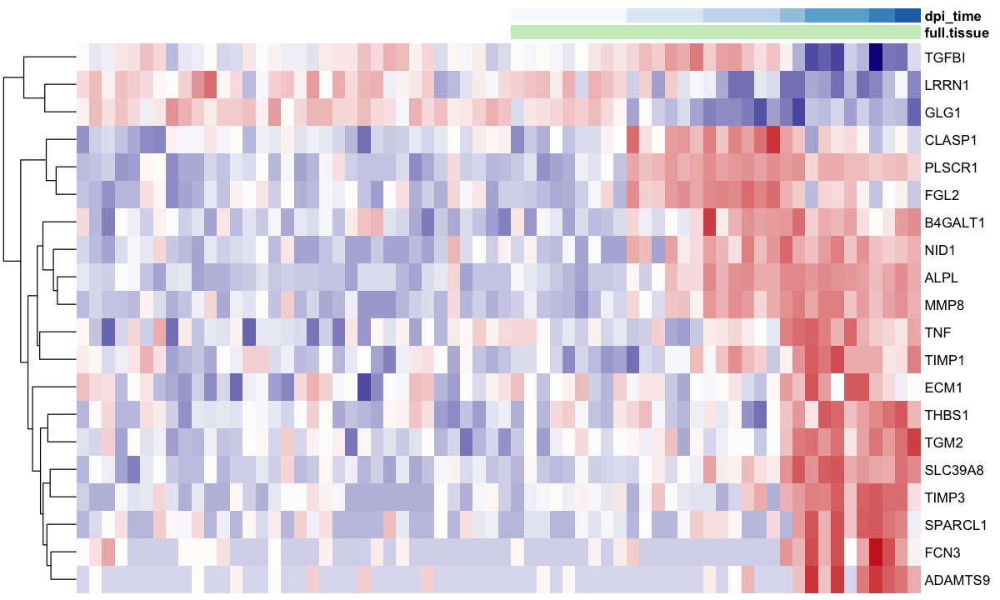

In [46]:
P9<-PlotTimePheat(c("Whole blood"),10,6)

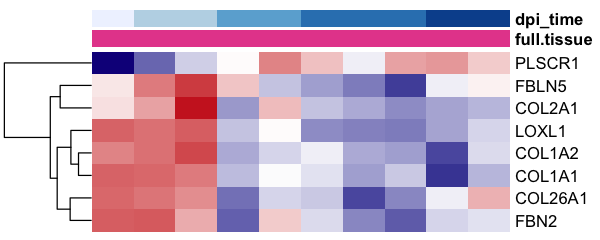

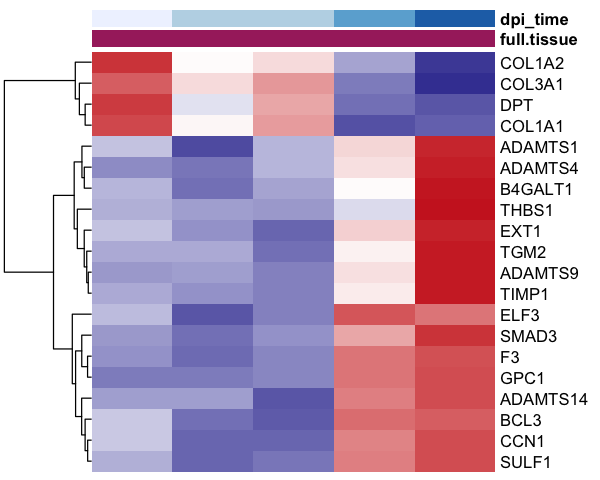

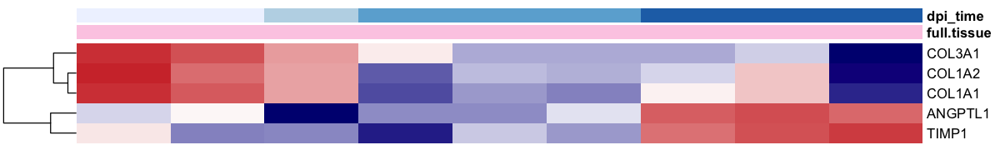

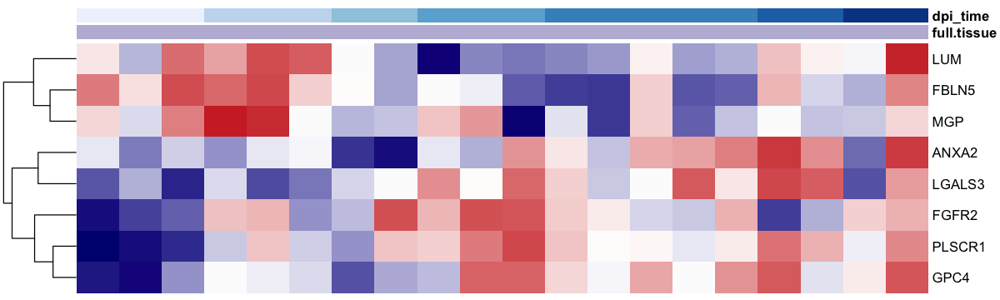

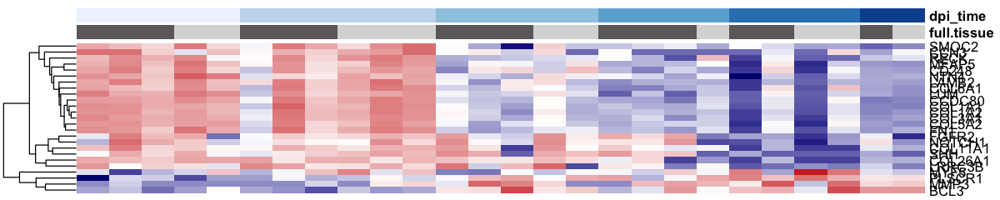

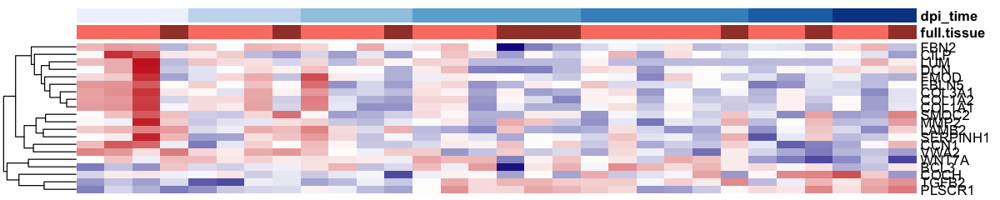

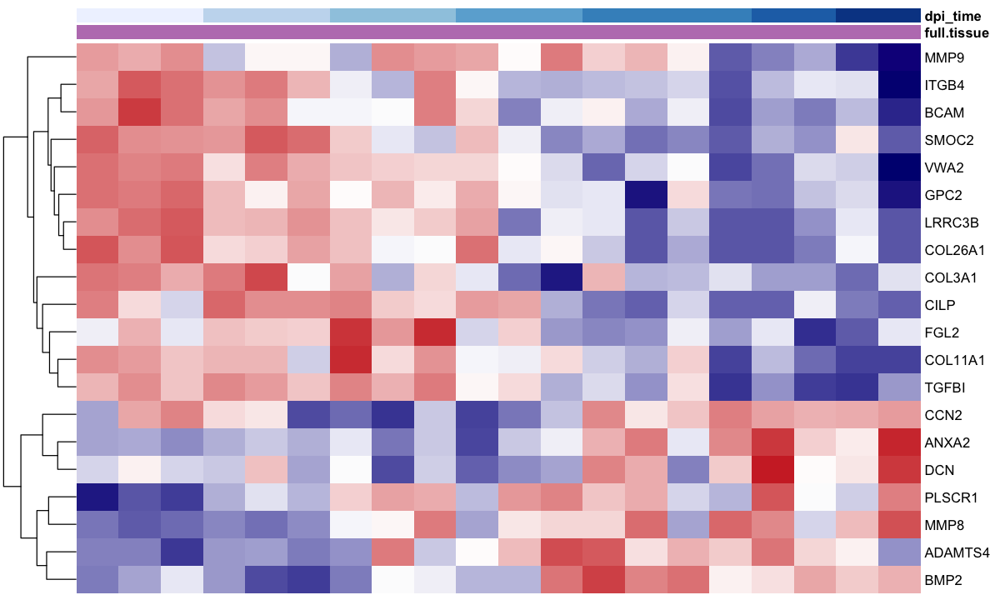

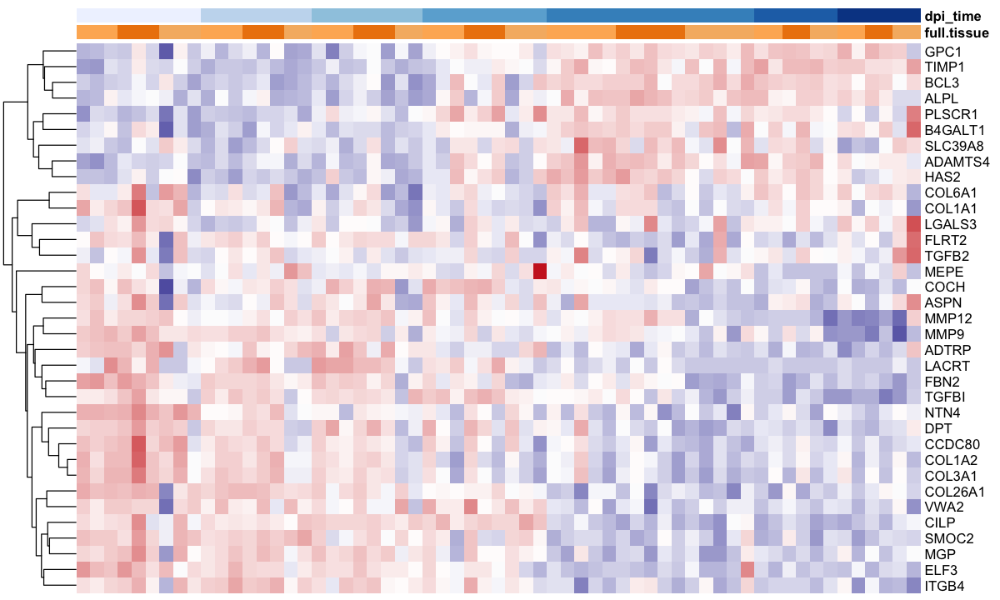

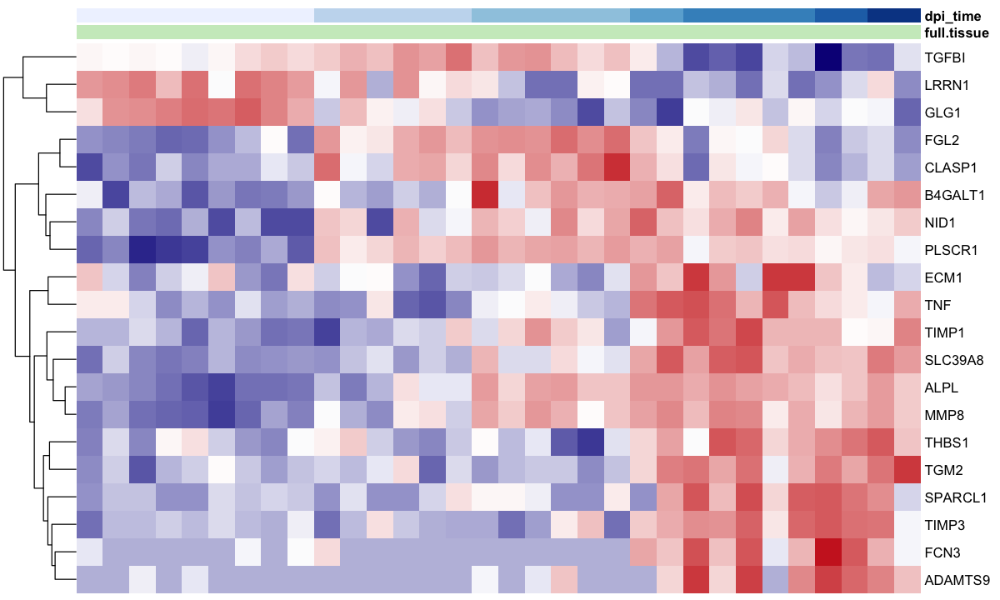

In [48]:
library(ggplotify)
P1<-PlotTimePheat(c('Sex Organ:Ovary'),5,2)
P2<-PlotTimePheat(c('Sex Organ:Testis'),5,4)
P3<-PlotTimePheat(c('Sex Organ:Sex-Organ'),10,1.5)
P4<-PlotTimePheat(c('Kidney'),10,3)
P5<-PlotTimePheat(c('Skin:Rash','Skin:Non-Rash'),10,2)
P6<-PlotTimePheat(c("Brain:Brain-Gr","Brain:Brain-Wh"),10,2)
P7<-PlotTimePheat(c("Spleen"),10,6)
P8<-PlotTimePheat(c("Lymph node:LN-AX-R", "Lymph node:LN-ING-L","Lymph node:LN-MES"),10,6)
P9<-PlotTimePheat(c("Whole blood"),10,6)

options(repr.plot.width=10,repr.plot.height=15)


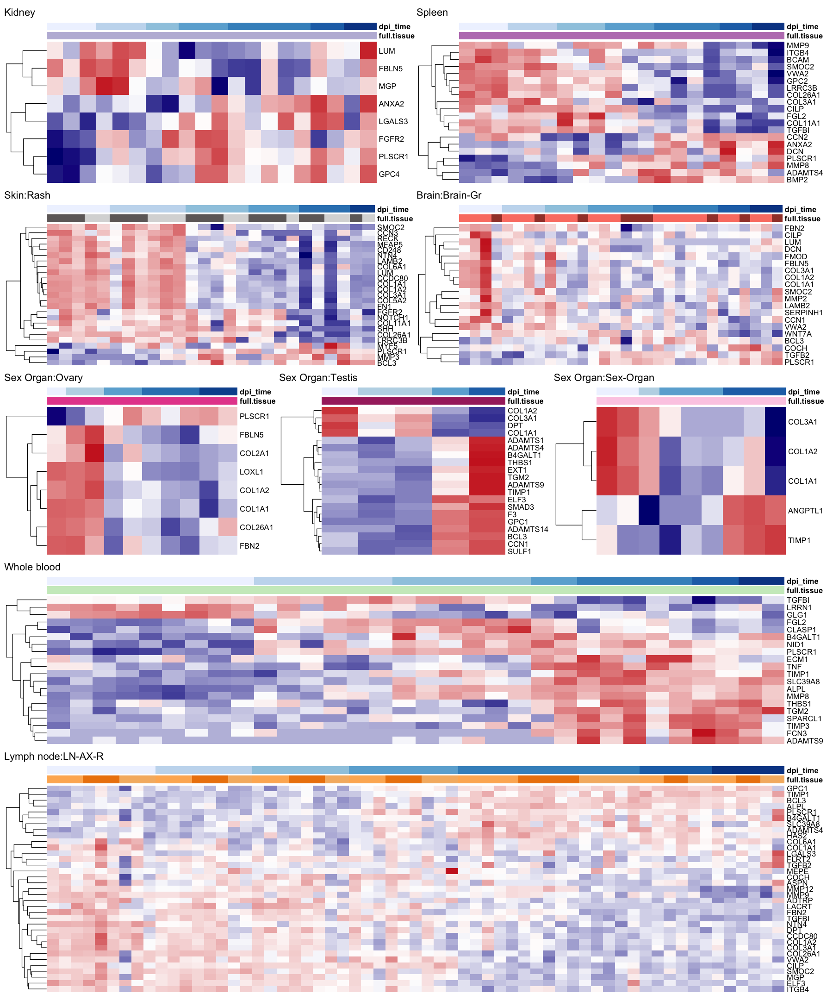

In [66]:
library(patchwork)
    options(repr.plot.width=15,repr.plot.height=18)
((P4/P5)|(P7/P6))/(P1+P2+P3)/P9/P8+plot_layout(heights = c(6,3,3,4))
ggsave("../ECM.pdf",width=15,height=18)


In [60]:
PlotTimePheat<-function(Tissues,Width,Height){
time.markers<-de.genes.Impulse  %>% filter(tissue %in% Tissues)

time.markers<-time.markers %>% filter(padj<0.05) 
time.markers <- time.markers %>% group_by(tissue) %>% top_n(60, -padj)
time.markers2<-unique(time.markers$Gene)
dds.qc.experimental<-dds.qc.experimental.alltp
dds.qc.experimental<-dds.qc.experimental[,dds.qc.experimental$full.tissue %in% Tissues] 
dds.qc.experimental<-dds.qc.experimental[,!dds.qc.experimental$dpi_time_factor %in% c("<0")] 

norm_counts <- counts(dds.qc.experimental, normalized=TRUE)
norm_counts <- log10(norm_counts[time.markers2,]+1)
scale_norm_markers <- norm_counts
rownames(scale_norm_markers) <- rowData(dds.qc.experimental.alltp)[rownames(scale_norm_markers),]$external_gene_name
scale_norm_markers<-scale_norm_markers[rownames(scale_norm_markers)[!is.na(rownames(scale_norm_markers)) & rownames(scale_norm_markers) != "" ],]

unique(dds.qc.experimental$full.tissue)
color_ft[unique(time.markers$tissue)]
dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=as.character(unique(dds.qc.experimental$dpi_time_factor))

unique(as.data.frame(colData(dds.qc.experimental))[,c('full.tissue','dpi_time_factor'),drop=FALSE]$dpi_time_factor)
col.order<-rownames(as.data.frame(colData(dds.qc.experimental))[c('full.tissue','dpi_time_factor')] %>% 
                dplyr::arrange(dpi_time_factor,full.tissue))
as.character(unique(dds.qc.experimental$dpi_time))

dpi_time=brewer.pal(n = length(unique(dds.qc.experimental$dpi_time_factor)), name = "Blues")
names(dpi_time)=sort(as.character(unique(dds.qc.experimental$dpi_time)))

mat_colors <- list(full.tissue=color_ft,dpi_time=dpi_time)

options(repr.plot.width=Width,repr.plot.height=Height)

library(pheatmap)

plot<-as.ggplot(pheatmap::pheatmap(scale_norm_markers[,col.order],
         clustering_distance_rows='euclidean',scale="row",
         color=colorRampPalette(c("navy", "white","firebrick3"))(100),
         border_color=NA,annotation_col=as.data.frame(colData(dds.qc.experimental[,dds.qc.experimental$dpi_time_factor != '<0']))[,c('full.tissue','dpi_time'),drop=FALSE],
         annotation_colors=mat_colors,legend=FALSE,annotation_legend=FALSE,
         show_colnames=FALSE,cluster_cols = FALSE,cluster_rows=TRUE))+ggtitle(paste(Tissues))

return(plot)
}

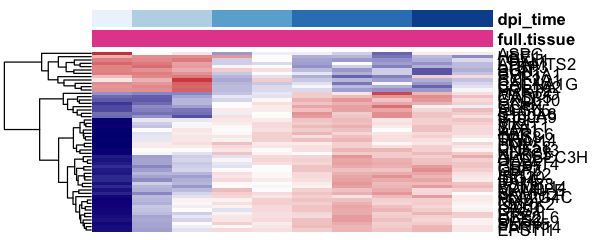

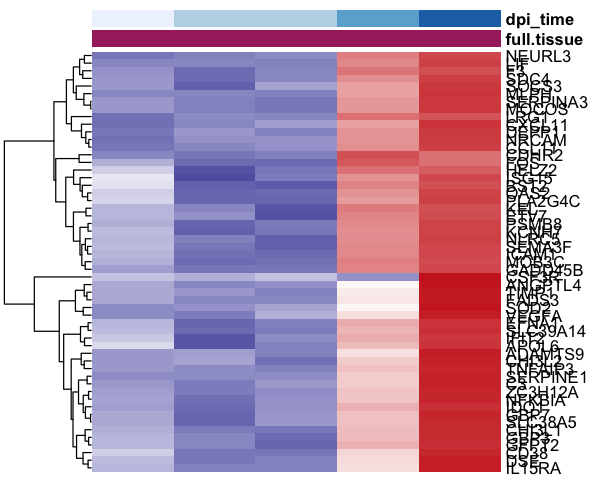

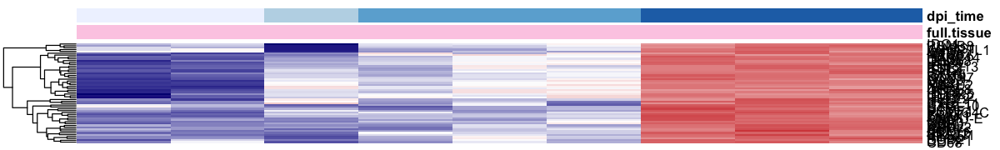

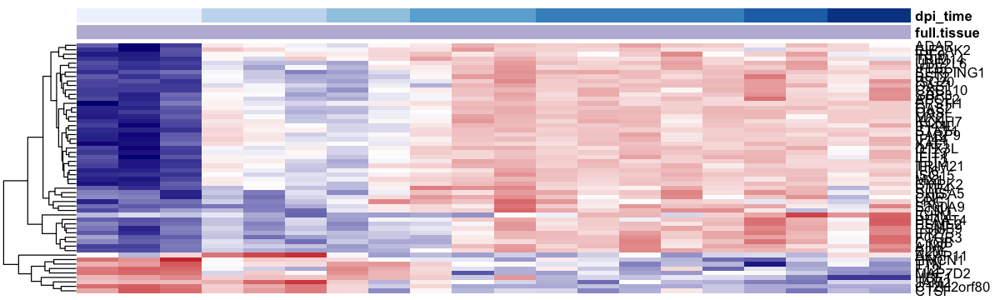

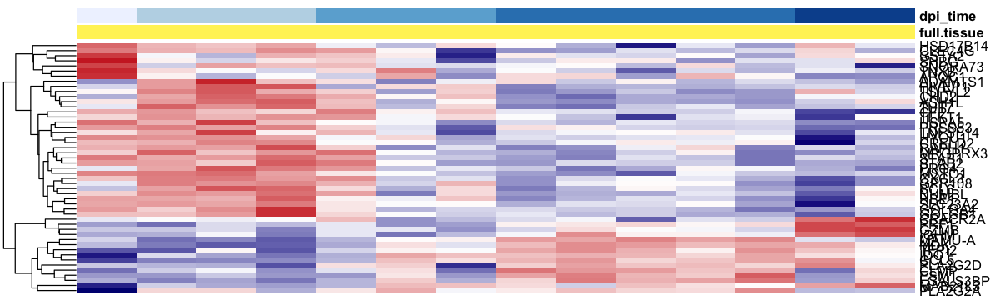

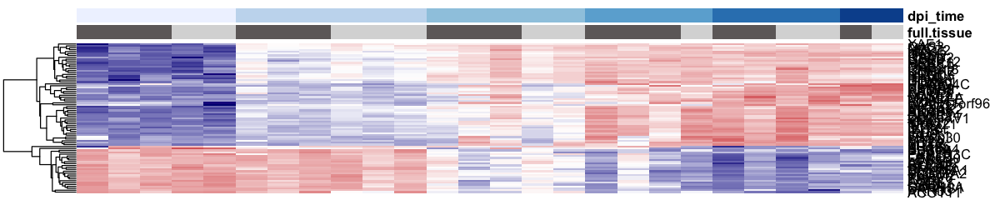

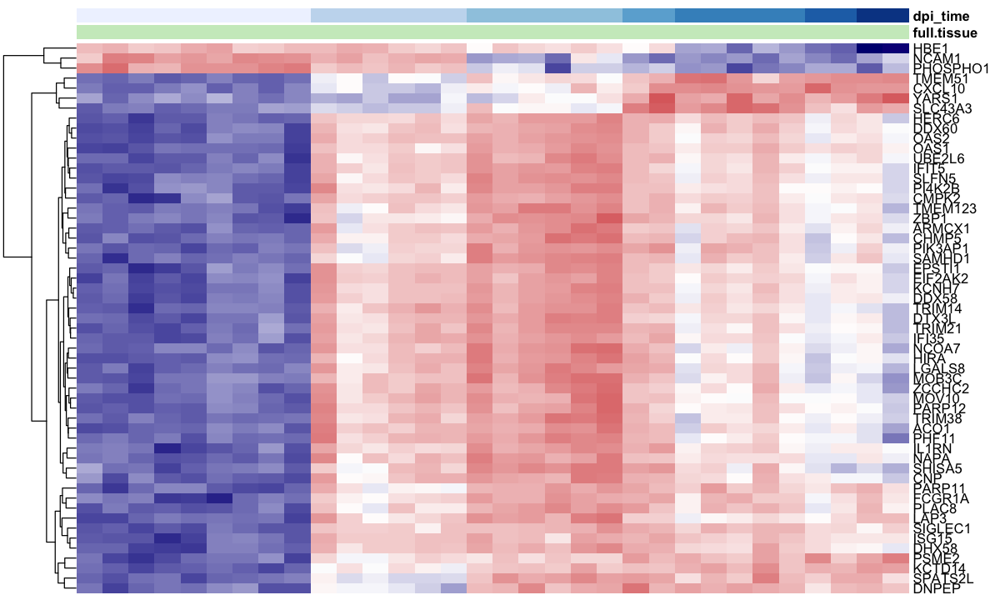

In [84]:
library(ggplotify)
P1<-PlotTimePheat(c('Sex Organ:Ovary'),5,2)
P2<-PlotTimePheat(c('Sex Organ:Testis'),5,4)
P3<-PlotTimePheat(c('Sex Organ:Sex-Organ'),10,1.5)
P4<-PlotTimePheat(c('Kidney'),10,3)
P6<-PlotTimePheat(c('Liver'),10,3)
P5<-PlotTimePheat(c('Skin:Rash','Skin:Non-Rash'),10,2)
P9<-PlotTimePheat(c("Whole blood"),10,6)

options(repr.plot.width=10,repr.plot.height=15)


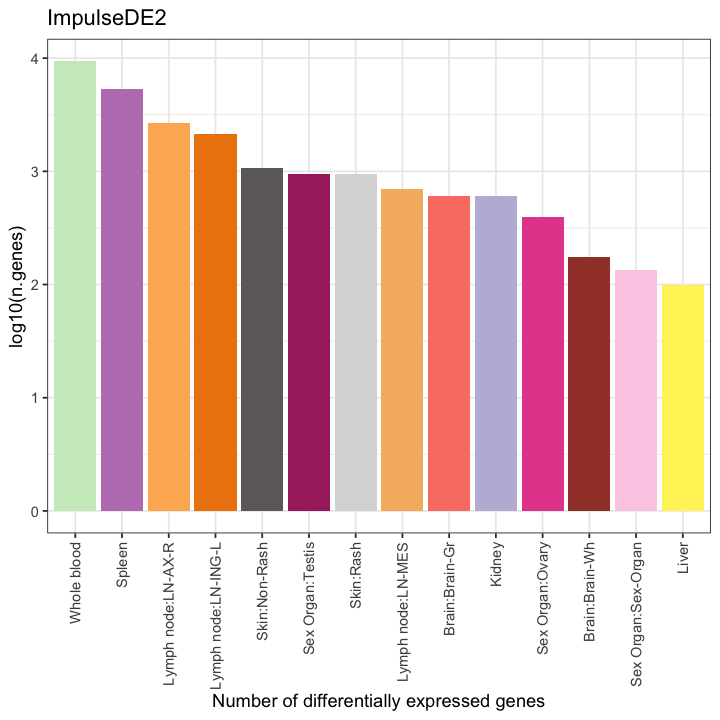

In [81]:
de.genes.all.tissues <- lapply(genes.ImpulseDE2.fulltissue, function(x) {
    xp <- x[NA2FALSE(x$padj < 0.05),]
     
    unique(rownames(xp))
})

n.de.per.tissue <- unlist(lapply(de.genes.all.tissues, length))
n.de.df.plot <- data.frame(
    tissue = names(n.de.per.tissue),
    n.genes = n.de.per.tissue
)
options(repr.plot.width=6, repr.plot.height=6)
Bar<-ggplot(n.de.df.plot %>% filter(!tissue %in% c("PBMC","Lung","Adrenal Gland")),
            aes(x=fct_reorder(tissue, desc(n.genes)),y=log10(n.genes),fill=tissue)) +
    geom_bar(stat='identity')+
    theme_bw() + scale_fill_manual(values = color_ft)+ 
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) + 
    scale_x_discrete("Number of differentially expressed genes")+ ggtitle("ImpulseDE2")+NoLegend()

Bar

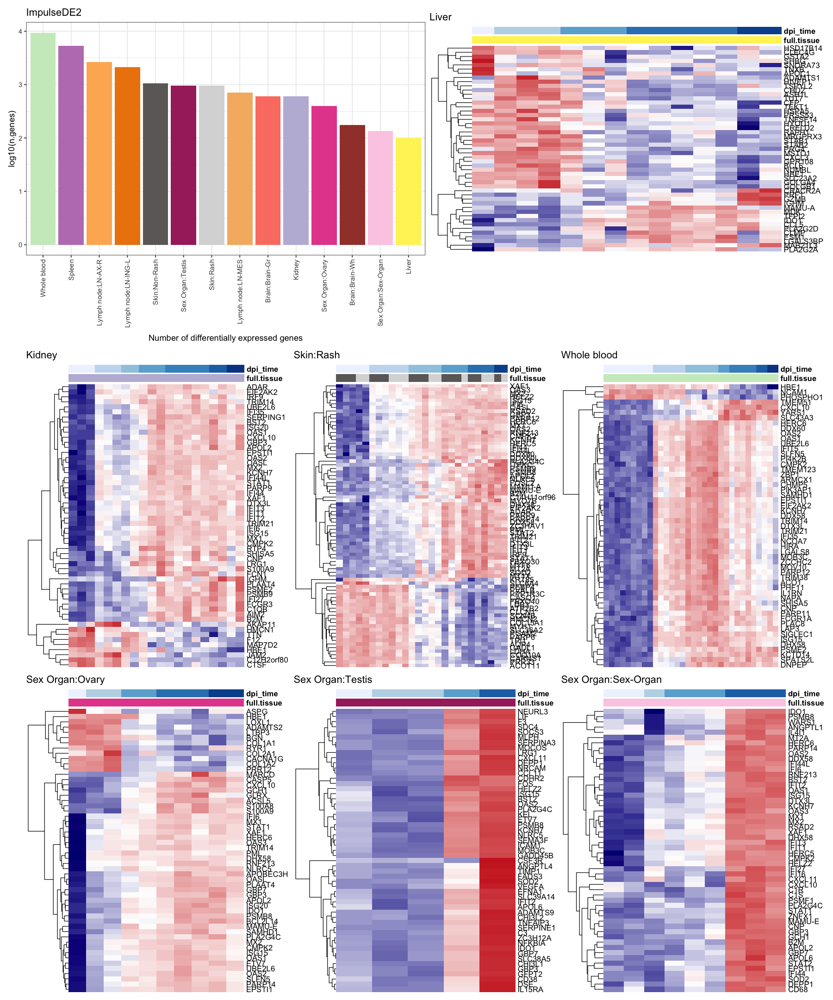

In [87]:
library(patchwork)
    options(repr.plot.width=15,repr.plot.height=18)
((Bar|P6)/(P4|P5|P9))/(P1+P2+P3)+plot_layout(heights = c(3,4,4))
ggsave("../Time.pdf",width=15,height=22)
